In [17]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import preprocessing
import warnings

warnings.filterwarnings('ignore')

import plotly.express as px
import plotly

# Combine 76 and 83 relationships

## 76 relationships: 27 participants

In [2]:
# Prep responses and key
raw = pd.read_csv('../input_data/qualtrics_data/'+
                  'RK - Literature Dimensions - fMRI Relationships_June 7, 2021_09.42.csv')
raw_reorg = raw.drop(axis='index',index=[0,1])
raw_reorg = raw_reorg.reset_index(drop=True)
raw_reorg['Duration (in seconds)'] = pd.to_numeric(raw_reorg['Duration (in seconds)'])
key = pd.read_csv('../input_data/qualtrics_data/qualtrics_question_key.csv')
dimensions = key['dimension'].tolist()[2:-3]
######

# filter the 27 participants who have finished 76 relationships_76r survey.
raw_reorg_id = raw_reorg
raw_reorg_id['MTurkCode'] = raw_reorg['MTurkCode']
raw_reorg_id['MTurkCode'] = pd.to_numeric(raw_reorg_id['MTurkCode'])

participants_id = pd.read_csv('../input_data/meadows_data/participants.csv')
within_27p = [int(i) for i in participants_id['MTurkCode'].dropna()]
raw_reorg_27p = raw_reorg_id[raw_reorg_id['MTurkCode'].isin(within_27p)]

# assign id to index for combining data later 
for MTurk_id in within_27p:
    raw_reorg_27p.loc[raw_reorg_27p['MTurkCode']==MTurk_id,
                      'id']=participants_id.loc[participants_id['MTurkCode']==MTurk_id,'id'].values[0]
raw_reorg_27p.index = raw_reorg_27p['id']
responses = raw_reorg_27p
responses = responses.loc[:, responses.columns.str.startswith('Q')]

# Get total number of responses
print("Total number of responses from qualtrics - "+str(len(responses)))
######

filter_col = [col for col in raw if col.startswith('Q8.2')]
relationships_76r = raw[filter_col].iloc[0]
relationships_76r = [s.replace('\xe2\x80\x93', '-') for s in relationships_76r]
relationships_76r = [i.split(' - ', 1)[1] for i in relationships_76r]
dimension_frames_76r = {}
count=2
for dim in dimensions:  # exclude foil and demographics
    filtered_cols = [col for col in raw_reorg if col.startswith('Q'+str(key['block'].iloc[count])+'.2')]
    dimension_frames_76r[dim] = pd.DataFrame(responses[filtered_cols])
    dimension_frames_76r[dim] = dimension_frames_76r[dim].apply(pd.to_numeric)
    dimension_frames_76r[dim].columns = relationships_76r
    count=count+1

print("Total number of relationships_76r - " + str(len(dimension_frames_76r[dim].columns)))
print("Total number of dimensions - " + str(len(dimensions)))

Total number of responses from qualtrics - 27
Total number of relationships_76r - 76
Total number of dimensions - 30


## 83 relationships: 14 participants

In [3]:
# Prep responses and key
raw = pd.read_csv('../input_data/qualtrics_data/Literature Dimensions - 83 Relationships_September 21, 2022_09.24.csv',
                 encoding = 'gb18030')
raw_reorg = raw.drop(axis='index',index=[0,1])
raw_reorg = raw_reorg.reset_index(drop=True)
raw_reorg['Duration (in seconds)'] = pd.to_numeric(raw_reorg['Duration (in seconds)'])
key = pd.read_csv('../input_data/qualtrics_data/qualtrics_question_key.csv')
dimensions = key['dimension'].tolist()[2:-3]
######

# filter the X participants who have finished 83 relationships_83r survey.
raw_reorg_id = raw_reorg
raw_reorg_id['MTurkCode'] = raw_reorg['random ID']
raw_reorg_id['MTurkCode'] = pd.to_numeric(raw_reorg_id['MTurkCode'])
participants_id = pd.read_excel('../input_data/qualtrics_data/qualtrics_survey_tracking.xlsx')
participants_id['qualtrics_code'] = pd.to_numeric(participants_id['qualtrics_code'])
within_14p = [int(i) for i in participants_id['qualtrics_code'].dropna()]
raw_reorg_14p = raw_reorg_id[raw_reorg_id['MTurkCode'].isin(within_14p)]

# assign id to index for combining data later 
for MTurk_id in within_14p:
    raw_reorg_14p.loc[raw_reorg_14p['MTurkCode']==MTurk_id,
                      'id']=participants_id.loc[participants_id['qualtrics_code']==MTurk_id,'subject_id'].values[0]
sub_id_list = raw_reorg_14p['id'].to_list()
raw_reorg_14p.index = raw_reorg_14p['id']
responses = raw_reorg_14p
responses = responses[~responses.index.isna()]
responses = responses.loc[:, responses.columns.str.startswith('Q')]

# Get total number of responses
print("Total number of responses from qualtrics - "+str(len(responses)))
######


filter_col = [col for col in raw if col.startswith('Q8.2')]
relationships_83r = raw[filter_col].iloc[0]
relationships_83r = [s.replace('\xe2\x80\x93', '-') for s in relationships_83r]
relationships_83r = [s.replace(' 鈥?', ' - ') for s in relationships_83r]    
relationships_83r = [s.replace('鈥檚', '') for s in relationships_83r]  
relationships_83r = [i.split(' - ', 1)[1] for i in relationships_83r]
dimension_frames_83r = {}
count=2
for dim in dimensions:  # exclude foil and demographics
    filtered_cols = [col for col in raw_reorg if col.startswith('Q'+str(key['block'].iloc[count])+'.2')]
    dimension_frames_83r[dim] = pd.DataFrame(responses[filtered_cols])
    dimension_frames_83r[dim] = dimension_frames_83r[dim].apply(pd.to_numeric)
    dimension_frames_83r[dim].columns = relationships_83r
    count=count+1

    
print("Total number of relationships_83r - " + str(len(dimension_frames_83r[dim].columns)))
print("Total number of dimensions - " + str(len(dimensions)))

Total number of responses from qualtrics - 14
Total number of relationships_83r - 83
Total number of dimensions - 30


## combine all relationships

In [4]:
def fix_labels(rels):
    # Make conditions list and the columns/rows of the distance matrix lowercase
    rels = [x.lower() for x in rels]

    rels = [x.replace('–','and') for x in rels]
    rels = [x.replace(' - ',' and ') for x in rels]
    rels = [x.replace('  ',' ') for x in rels]
    rels = [x.replace('between ','') for x in rels]
    
    rels = [x.replace('-',' ') for x in rels]
    
    rels = [x.replace('monarch and minister', 'a monarch and their minister') for x in rels]
    rels = [x.replace('person and crush', 'a person and their crush') for x in rels]
    rels = [x.replace('person and deceased spouse', 'a person and their deceased spouse') for x in rels]
    rels = [x.replace('person and family friends', 'a person and their family friends') for x in rels]
    rels = [x.replace('uncle and neice/nephew', 'uncle and niece/nephew') for x in rels]
    rels = [x.replace('man’s wife and man’s mistress', 'man wife and man mistress') for x in rels]
     
    return rels

In [5]:
# get index of participants in 83 relationships survey
dim = dimensions[0]
within_14p = list(dimension_frames_83r[dim].index)
relationships = relationships_76r + relationships_83r
relationships = fix_labels(relationships)

dimension_frames_159r = {}
for dim in dimensions:
    df_76r = dimension_frames_76r[dim].loc[within_14p,:]
    df_83r = dimension_frames_83r[dim]
    df_159r = df_76r.join(df_83r)
    df_159r.columns = relationships
    dimension_frames_159r[dim] = df_159r

In [6]:
print("Total number of relationships_159r - " + str(len(dimension_frames_159r[dim].columns)))
print("Total number of dimensions - " + str(len(dimensions)))

Total number of relationships_159r - 159
Total number of dimensions - 30


# Demographics

In [7]:
filtered_demo = [col for col in raw_reorg_14p if col.startswith('Q36')]
response_demographic = responses.loc[:,filtered_demo]
response_demographic.columns = ['Age','Gender','Race','Ethnicity',
                                'Highest education','First language','First language alternative']
response_demographic = response_demographic.apply(pd.to_numeric)
print(response_demographic.shape)
response_demographic

(14, 7)


,Age,Gender,Race,Ethnicity,Highest education,First language,First language alternative
id,,,,,,,
soc-700,13,1,11,2,15,23,NaN
soc-754,12,1,11,2,13,23,NaN
soc-301,13,1,11,2,17,23,NaN
soc-767,12,1,11,2,15,23,NaN
soc-722,12,2,11,2,15,23,NaN
soc-765,13,1,11,2,16,23,NaN
soc-716,13,2,11,2,15,23,NaN
soc-720,13,2,11,2,15,23,NaN
soc-706,13,1,11,2,15,23,NaN


## Gender

In [8]:
# replace index to corresponding label
gender_map = {1:'female',2:'male',4:'prefer not to answer'}
response_demographic['Gender_label'] = response_demographic['Gender'].map(gender_map)
response_demographic['Gender_label'].value_counts()

female                  9
male                    4
prefer not to answer    1
Name: Gender_label, dtype: int64

## Age

In [9]:
# replace index to corresponding label
age_map = {12:'18-24',13:'25-34'}
response_demographic['Age_label'] = response_demographic['Age'].map(age_map)
response_demographic['Age_label'].value_counts()

25-34    9
18-24    5
Name: Age_label, dtype: int64

## Race

In [10]:
# replace index to corresponding label
race_map = {11:'White',16:'Other'}
response_demographic['Race_label'] = response_demographic['Race'].map(race_map)
response_demographic['Race_label'].value_counts()

White    13
Other     1
Name: Race_label, dtype: int64

## Highest education

In [11]:
# replace index to corresponding label
education_map = {13:'Some college',15:'4 year degree',16:'Professional degree',17:'Doctorate'}
response_demographic['education_label'] = response_demographic['Highest education'].map(education_map)
response_demographic['education_label'].value_counts()

4 year degree          8
Doctorate              3
Professional degree    2
Some college           1
Name: education_label, dtype: int64

# Dimension Relationship Ratings Matrix

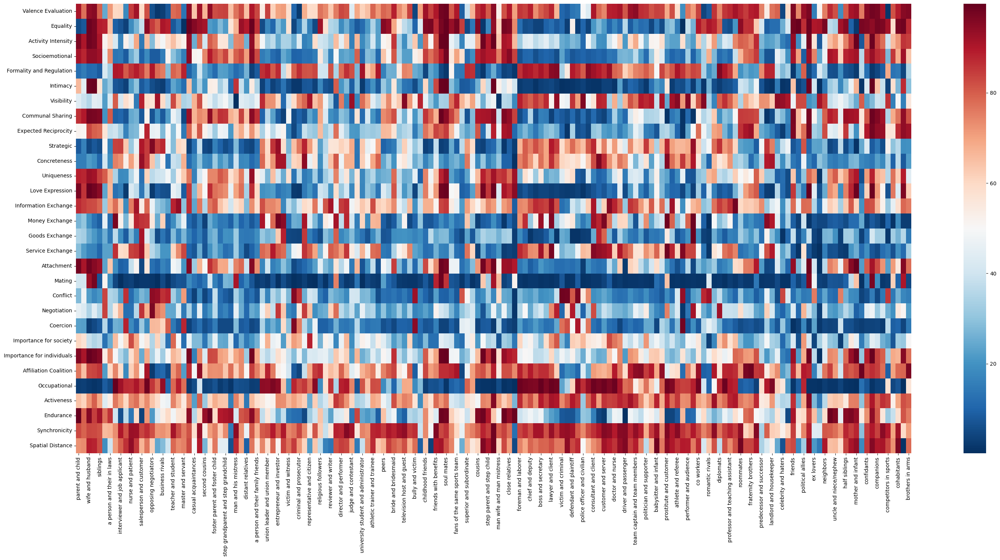

In [12]:
dim_rel = pd.DataFrame(columns=relationships)
count = 0
col_names = []
for dim in dimension_frames_159r.keys():
    dim_rel.loc[count] = dimension_frames_159r[dim].mean().tolist()
    col_names.append(dim)
    count = count + 1
    
dim_rel.index = dimension_frames_159r.keys()
dim_rel.to_csv('../output_data/group/dimension/within_dim_rel.csv')

plt.figure(figsize=(30,15))
heatmap = sns.heatmap(dim_rel, center=50,cmap="RdBu_r")
fig = heatmap.get_figure()
plt.tight_layout()
#fig.savefig(output_dir+'dim_rel_heatmap.png')

dim_rel_scaled = preprocessing.scale(dim_rel.transpose())
dim_rel_scaled_df = pd.DataFrame(dim_rel_scaled, index=dim_rel.columns,
                                 columns=dim_rel.index)
dim_rel_scaled_df.to_csv('../output_data/group/dimension/within_dim_rel_scaled.csv')

# PCA(M6)

In [2]:
library(FactoMineR)
library(factoextra)#fviz_eig
library(psych)

library(ggplot2)
library(corrplot)
library(RColorBrewer)

library(tidyverse)
library(reshape)#melt6
library(nFactors)#optimal number of components

In [3]:
plotnScree <-
function (nScree,
          elbow = 3,
          legend = TRUE,
          ylab   = "Eigenvalues",
          xlab   = "Components",
          main   = "Non Graphical Solutions to Scree Test")
          {
   if (!inherits(nScree, "nScree"))  stop("Method is only for nScree objects")
   #if (!exists("legend", mode="logical") ) legend <- TRUE                                   # To develop
   #if (!exists("ylab"))                    ylab <- "Eigenvalues"                            # To develop
   #if (!exists("xlab"))                    xlab <- "Components"                             # To develop
   #if (!exists("main"))                    main <- "Non Graphical Solutions to Scree Test"  # To develop
   if (nScree$Model == "components") nkaiser = "Eigenvalues (>mean  = " else nkaiser = "Eigenvalues (>0 = "
   if (nScree$Model == "factors")  xlab   = "Factors"
   par(col   = 1, pch = 1)     # Color and symbol for usual scree
   par(mfrow = c(1,1),lwd=2)
   eig        <- nScree$Analysis$Eigenvalues
   k          <- 1:length(eig)
   #plotuScree(x=eig, ...)                                                                   # To develop
   plotuScree(x=eig, main=main, xlab=xlab, ylab=ylab)
   nk         <- length(eig)
   noc        <- nScree$Components$noc
   vp.p       <- lm(eig[c(noc+1,nk)] ~ k[c(noc+1,nk)])
   x          <- sum(c(1,1) * coef(vp.p))
   y          <- sum(c(1,nk)* coef(vp.p))
   par(col = 10)            # Color for optimal coordinates
   lines(k[c(1,nk)],c(x,y),lwd=1.8)
   par(col = 11,pch=2)            # Color and symbol for parallel analysis
   lines(1:nk, nScree$Analysis$Par.Analysis, type = "b",lwd=1.8)
   if (legend == TRUE) {
     leg.txt  <- c(paste("Parallel Analysis (n = ",nScree$Components$nparallel,")"),
                 c(paste("Kaiser-Guttman rule (n = ",nScree$Components$nkaiser,")")),
                 c(paste("Cattell’s scree test (n = ",elbow,")")),
                 c(paste("Optimal Coordinates (n = ",nScree$Components$noc,")")) )
     legend("topright",
            legend   = leg.txt,
            pch      = c('△','_','○','_'),
            text.col = c(3,4,1,2), 
            col = c(3,4,1,2),
            cex = 1.3)
     }
   naf        <-   nScree$Components$naf
   text(x = noc ,    y = eig[noc],     label = " (OC)", cex = 1, adj = c(0,0), col = 2)
#    text(x = naf + 1, y = eig[naf + 1], label = " (AF)", cex = .70, adj = c(0,0), col = 4)
   }

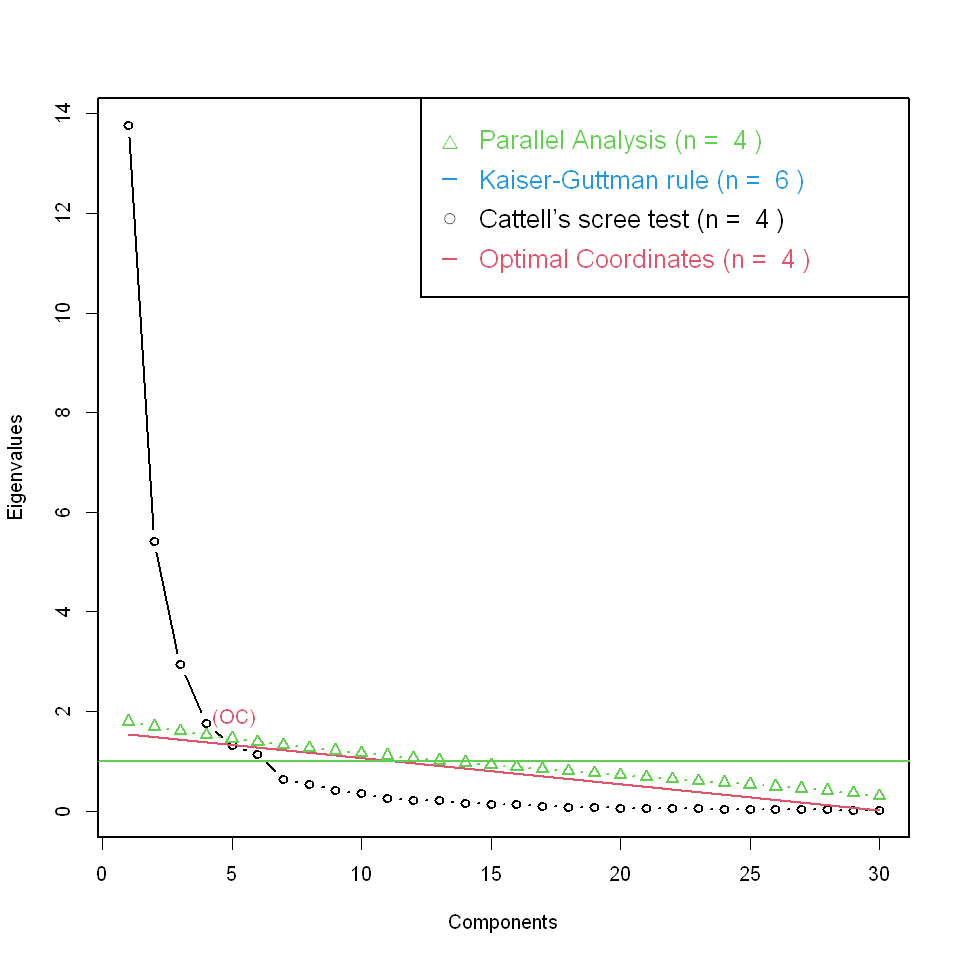

In [4]:
# import relationship dimension ratings scaled from the Data cleaning's output
dim_rel_scaled = read.csv('../output_data/group/dimension/within_dim_rel_scaled.csv', 
                          row.names=1,encoding='UTF-8',check.names=FALSE)

options(repr.plot.width=8, repr.plot.height=8)
# Parallel analysis, Optimal Coordinates, and  Cattell's Scree Test
ev <- eigen(cor(dim_rel_scaled)) # get eigenvalues
ap <- parallel(subject=nrow(dim_rel_scaled),var=ncol(dim_rel_scaled),model="components",rep=5000,cent=.05) 
nS <- nScree(x=ev$values, aparallel=ap$eigen$qevpea) # "qevpea" indicate 95 centile given cent=.05

plotnScree(nS,elbow = 4, legend=TRUE, main = NULL)
abline(h = 1, col=3, lty=1,lwd =1.8) # Kaiser-Guttman Rule

In [5]:
dim_rel_scaled = read.csv('../output_data/group/dimension/within_dim_rel_scaled.csv',row.names=1)
dim_rel.pca = prcomp(dim_rel_scaled)
ncomp = 5

loadings_none = dim_rel.pca$rotation[,1:ncomp] %*% diag(dim_rel.pca$sdev,ncomp,ncomp)
scores_none = dim_rel.pca$x[,1:ncomp] 

loadings_var = varimax(loadings_none)$loadings
scores_var = scale(scores_none) %*% varimax(loadings_none)$rotmat

loadings_var

write.csv(loadings_var,'../output_data/group/dimension/within_loadings_var.csv')
write.csv(scores_var,'../output_data/group/dimension/within_scores_var.csv')


Loadings:
                           [,1]   [,2]   [,3]   [,4]   [,5]  
Valence.Evaluation         -0.257  0.153  0.924              
Equality                   -0.230 -0.136               -0.892
Activity.Intensity         -0.800  0.387  0.212  0.191 -0.211
Socioemotional             -0.810 -0.128  0.211  0.235 -0.434
Formality.and.Regulation    0.730  0.248        -0.219  0.517
Intimacy                   -0.854  0.139  0.213        -0.270
Visibility                  0.814                0.209       
Communal.Sharing           -0.659         0.414  0.327 -0.503
Expected.Reciprocity       -0.361  0.174  0.334 -0.168 -0.780
Strategic                   0.673  0.269 -0.233 -0.403  0.382
Concreteness                0.532  0.254        -0.568  0.505
Uniqueness                 -0.865  0.191               -0.114
Love.Expression            -0.844         0.373  0.134 -0.270
Information.Exchange       -0.107  0.479  0.695         0.189
Money.Exchange              0.397  0.118        -0.687  0.4

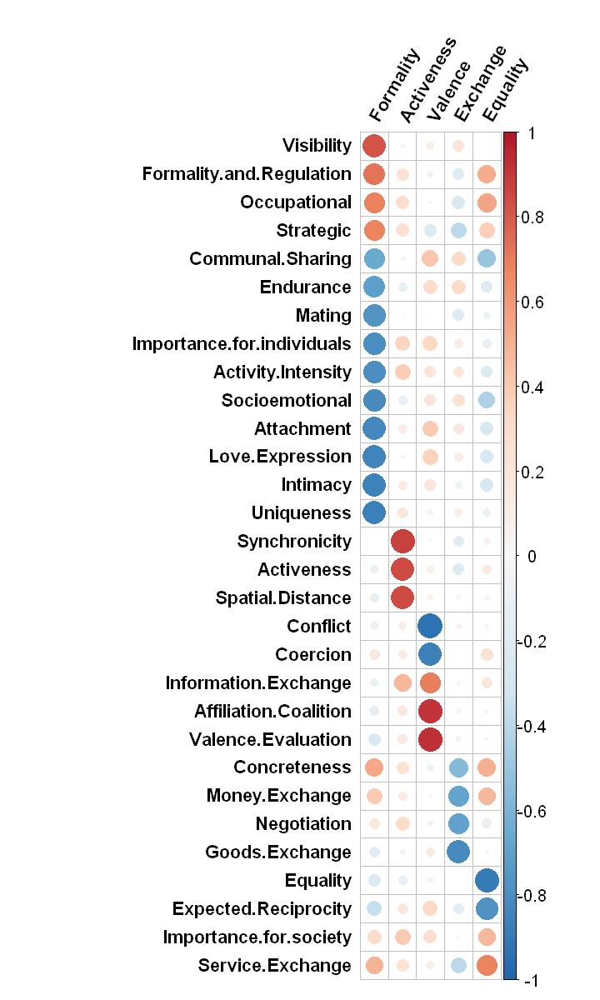

In [6]:
loadings_var_reorder = as.data.frame(loadings_var[,1:ncomp])
colnames(loadings_var_reorder) = c('Formality','Activeness','Valence','Exchange','Equality')

#filter each row's max loading, and attribute it to correspnding column.
order_list = c()
for (row in c(1:30)){
    temp_max = abs(loadings_var_reorder[row,1])
    n = 1
    for (col in c(2:5)){
        temp = abs(loadings_var_reorder[row,col])
        if (temp > temp_max){
            temp_max = temp
            n = col
        }
        
    }
    order_list[row] = n
}
loadings_var_reorder = loadings_var_reorder %>% mutate(order = order_list) %>% arrange(order)
RC1 = loadings_var_reorder %>% filter(order==1) %>% arrange(desc(Formality))
RC2 = loadings_var_reorder %>% filter(order==2) %>% arrange(desc(Activeness))
RC3 = loadings_var_reorder %>% filter(order==3) %>% arrange(Valence)
RC4 = loadings_var_reorder %>% filter(order==4) %>% arrange(desc(Exchange))
RC5 = loadings_var_reorder %>% filter(order==5) %>% arrange(Equality)

loadings_var_reorder = rbind(RC1,RC2,RC3,RC4,RC5)
loadings_var_reorder = loadings_var_reorder[1:5]

options(repr.plot.width=6, repr.plot.height=10)
my.breaks = c(seq(-1,1,by=0.01))
corrplot(as.matrix(loadings_var_reorder),is.corr=FALSE,
         tl.col = "black",tl.srt=60,tl.cex=1.1,family='sans',font=2,
         col.lim = c(-1,1),cl.ratio = 0.4,cl.cex=1,
         col = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(length(my.breaks)))

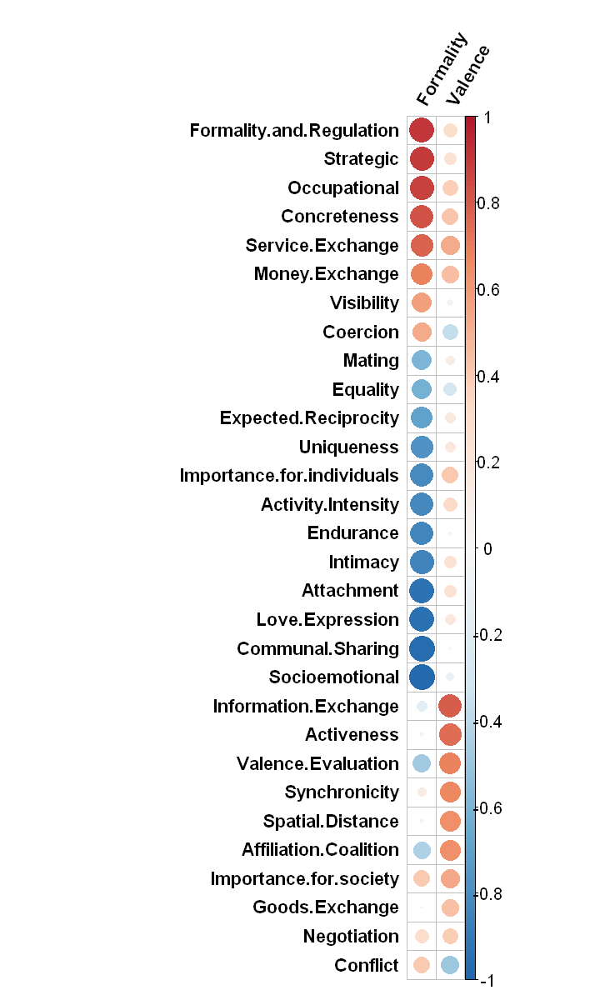

In [7]:
dim_rel.pca = prcomp(dim_rel_scaled)
ncomp = 2

loadings_none = dim_rel.pca$rotation[,1:ncomp] %*% diag(dim_rel.pca$sdev,ncomp,ncomp)
scores_none = dim_rel.pca$x[,1:ncomp] 

loadings_var = varimax(loadings_none)$loadings
scores_var = scale(scores_none) %*% varimax(loadings_none)$rotmat

write.csv(loadings_var,'../output_data/group/dimension/within_loadings_var_2c.csv')
write.csv(scores_var,'../output_data/group/dimension/within_scores_var_2c.csv')

loadings_var_reorder = as.data.frame(loadings_var[,1:ncomp])
colnames(loadings_var_reorder) = c('Formality','Valence')

#filter each row's max loading, and attribute it to correspnding column.
order_list = c()
for (row in c(1:30)){
    temp_max = abs(loadings_var_reorder[row,1])
    n = 1
    for (col in c(2)){
        temp = abs(loadings_var_reorder[row,col])
        if (temp > temp_max){
            temp_max = temp
            n = col
        }
        
    }
    order_list[row] = n
}
loadings_var_reorder = loadings_var_reorder %>% mutate(order = order_list) %>% arrange(order)
RC1 = loadings_var_reorder %>% filter(order==1) %>% arrange(desc(Formality))
RC2 = loadings_var_reorder %>% filter(order==2) %>% arrange(desc(Valence))
loadings_var_reorder = rbind(RC1,RC2)
loadings_var_reorder = loadings_var_reorder[1:2]

options(repr.plot.width=6, repr.plot.height=10)
my.breaks = c(seq(-1,1,by=0.01))
corrplot(as.matrix(loadings_var_reorder),is.corr=FALSE,
         tl.col = "black",tl.srt=60,tl.cex=1.1,family='sans',font=2,
         col.lim = c(-1,1),cl.ratio = 1.2,cl.cex=1,
         col = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(length(my.breaks)))

# MDS

In [2]:
library(tidyverse)
library(MASS)
library(corrplot)
library(RColorBrewer)
library(corrplot)
library(ggrepel)

In [3]:
MDS_Regression = function(dissim, DV, ndim=5, type_mds){
    if(type_mds == 'mds'){
        fit_mds_score_none = cmdscale(dissim,eig=TRUE,k=ndim)
    }
    if(type_mds == 'nmds'){
        fit_mds_score_none = isoMDS(as.matrix(dissim),k=ndim)
    }    
    
    # plot solution
    Dim1 = fit_mds_score_none$points[,1]
    Dim2 = fit_mds_score_none$points[,2]
    
    options(repr.plot.width=5, repr.plot.height=5)
    plot(Dim1, Dim2, xlab="Formality", ylab="Valence",main="mds", type="n")
    text(Dim1, Dim2, labels = row.names(dissim), cex=.6)
    
    # independent variable for regression 
    IV = fit_mds_score_none$points
    IV = as.data.frame(IV)
    IV_reorder = IV[rownames(DV),]
    
    count = 0
    for (i in seq(159)){
        if (rownames(DV)[i] == rownames(IV_reorder)[i]){
            count = count+1
        }
    }

    if (count == 159){
        coe_matrix = matrix(nrow = 30, ncol = 7)
        coe_df = as.data.frame(coe_matrix)
        row.names(coe_df) = colnames(DV)
        colnames(coe_df) = c('V1','V2','V3','V4','V5','R2','F')

        #Regression in each dimension
        for (i in seq(30)){
            if (ndim==5){
                fit = lm(DV[[i]]~IV_reorder$V1+IV_reorder$V2+IV_reorder$V3+IV_reorder$V4+IV_reorder$V5)
            }
            if (ndim==4){
                fit = lm(DV[[i]]~IV_reorder$V1+IV_reorder$V2+IV_reorder$V3+IV_reorder$V4)
            }
            if (ndim==2){
                fit = lm(DV[[i]]~IV_reorder$V1+IV_reorder$V2)
            }
            #print(colnames(DV)[i])
            #print(summary(fit))

            for (j in 1:ndim){
                coe_df[i,j] = fit$coefficients[j+1]
              }
              coe_df[i,6] = summary(fit)$r.square
              coe_df[i,7] = summary(fit)$fstatistic[1]
        }
    }
    
    #output
    result = list(coe_df = coe_df,
                  IV = IV)
    return(result)
}

Plot_coefficient = function(coe_df,ndim=5,task='Implicit'){
    options(repr.plot.width=6, repr.plot.height=6)
    loadings_none_reorder = coe_df[,1:ndim]

    #filter each row's max loading, and attribute it to correspnding column.
    order_list = c()
    for (row in c(1:30)){
        temp_max = abs(loadings_none_reorder[row,1])
        n = 1
        for (col in c(1:ndim)){
            temp = abs(loadings_none_reorder[row,col])
            if (temp > temp_max){
                temp_max = temp
                n = col
            }

        }
        order_list[row] = n
    }
    
    loadings_none_reorder = loadings_none_reorder %>% mutate(order = order_list) %>% arrange(order)
    
    if (ndim==2) {
        V1 = loadings_none_reorder %>% filter(order==1) %>% arrange(desc(V1))
        V2 = loadings_none_reorder %>% filter(order==2) %>% arrange(desc(V2))
        loadings_none_reorder = rbind(V1,V2)
        loadings_none_reorder = loadings_none_reorder[1:ndim]
        colnames(loadings_none_reorder) = c('V1','V2')
    }

    if (ndim==4) {
        V1 = loadings_none_reorder %>% filter(order==1) %>% arrange(desc(V1))
        V2 = loadings_none_reorder %>% filter(order==2) %>% arrange(desc(V2))
        V3 = loadings_none_reorder %>% filter(order==3) %>% arrange(desc(V3))
        V4 = loadings_none_reorder %>% filter(order==4) %>% arrange(desc(V4))
        loadings_none_reorder = rbind(V1,V2,V3,V4)
        loadings_none_reorder = loadings_none_reorder[1:ndim]
        colnames(loadings_none_reorder) = c('V1','V2','V3','V4')
    }
    
    if (ndim==5) {
        V1 = loadings_none_reorder %>% filter(order==1) %>% arrange(desc(V1))
        V2 = loadings_none_reorder %>% filter(order==2) %>% arrange(desc(V2))
        V3 = loadings_none_reorder %>% filter(order==3) %>% arrange(desc(V3))
        V4 = loadings_none_reorder %>% filter(order==4) %>% arrange(desc(V4))
        V5 = loadings_none_reorder %>% filter(order==5) %>% arrange(desc(V5))
        loadings_none_reorder = rbind(V1,V2,V3,V4,V5)
        loadings_none_reorder = loadings_none_reorder[1:ndim]
        colnames(loadings_none_reorder) = c('V1','V2','V3','V4','V5')
    }

    #title = paste(task,'76 rels')
#     loadings_plot = pheatmap(loadings_none_reorder,cluster_row = FALSE, cluster_col = FALSE,
#              color = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(100),
#              angle_col = '0',fontsize_col = 12, main=title)
    
    options(repr.plot.width=6, repr.plot.height=10)
    #my.breaks = c(seq(-1,1,by=0.01))
    corrplot(as.matrix(loadings_none_reorder),is.corr=FALSE,tl.col = "black",tl.srt=90,tl.cex=1,cl.ratio = 0.4,cl.cex=1,
             col = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(100))    
}

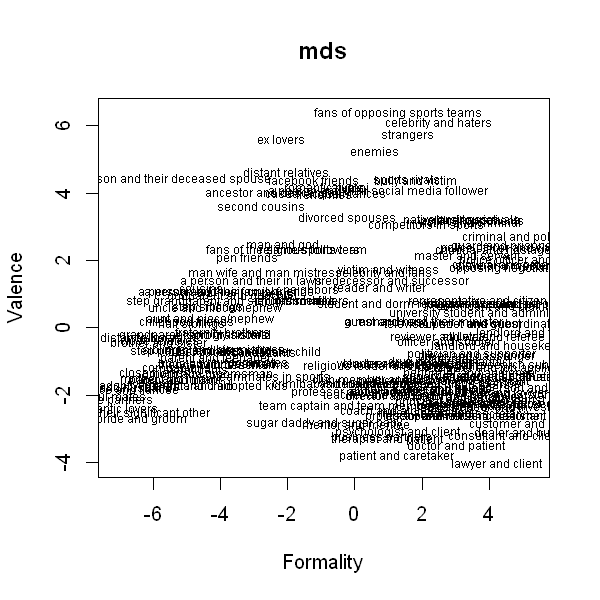

In [4]:
DV_159 = read.csv('../output_data/group/dimension/within_dim_rel_scaled.csv',row.names=1)
dim_dist = as.matrix(dist(DV_159,method = "euclidean"))

# MDS
coe_df_5d = MDS_Regression(dim_dist,DV_159,ndim=5,type_mds='mds')$coe_df
IV_5d = MDS_Regression(dim_dist,DV_159,ndim=5,type_mds='mds')$IV

In [5]:
dimensions = c('Valence Evaluation','Equality','Activity Intensity','Socioemotional','Formality and Regulation',
               'Intimacy','Visibility','Communal Sharing','Expected Reciprocity','Strategic',
               'Concreteness','Uniqueness','Love Expression','Information Exchange','Money Exchange',
               'Goods Exchange','Service Exchange','Attachment','Mating','Conflict','Negotiation',
               'Coercion','Importance for society','Importance for individuals','Affiliation Coalition',
               'Occupational','Activeness','Endurance','Synchronicity','Spatial Distance')

In [6]:
# options(repr.plot.width=6,repr.plot.height=10)
# rownames(coe_df_5d) = dimensions
# loadings_var_reorder = as.data.frame(coe_df_5d[,1:5])
# colnames(loadings_var_reorder) = c('Formality','Activeness','Valence','Exchange','Equality')
# #filter each row's max loading, and attribute it to correspnding column.
# order_list = c()
# for (row in c(1:30)){
#     temp_max = abs(loadings_var_reorder[row,1])
#     n = 1
#     for (col in c(2:5)){
#         temp = abs(loadings_var_reorder[row,col])
#         if (temp > temp_max){
#             temp_max = temp
#             n = col
#         }
        
#     }
#     order_list[row] = n
# }
# loadings_var_reorder = abs(loadings_var_reorder) %>% mutate(order = order_list) %>% arrange(order)
# RC1 = loadings_var_reorder %>% filter(order==1) %>% arrange(desc(Formality))
# RC2 = loadings_var_reorder %>% filter(order==2) %>% arrange(desc(Activeness))
# RC3 = loadings_var_reorder %>% filter(order==3) %>% arrange(desc(Valence))
# RC4 = loadings_var_reorder %>% filter(order==4) %>% arrange(desc(Exchange))
# RC5 = loadings_var_reorder %>% filter(order==5) %>% arrange(desc(Equality))

# loadings_var_reorder = rbind(RC1,RC2,RC3,RC4,RC5)
# loadings_var_reorder = loadings_var_reorder[1:5]

# corrplot(as.matrix(loadings_var_reorder),is.corr=FALSE,
#          tl.col = "black",tl.srt=60,tl.cex=1.1,family='sans',font=2,
#          col.lim = c(0,0.5),cl.ratio = 0.4,cl.cex=1,
#          #col = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(length(my.breaks)))
#          col= colorRampPalette(c("white","darkred"))(100))

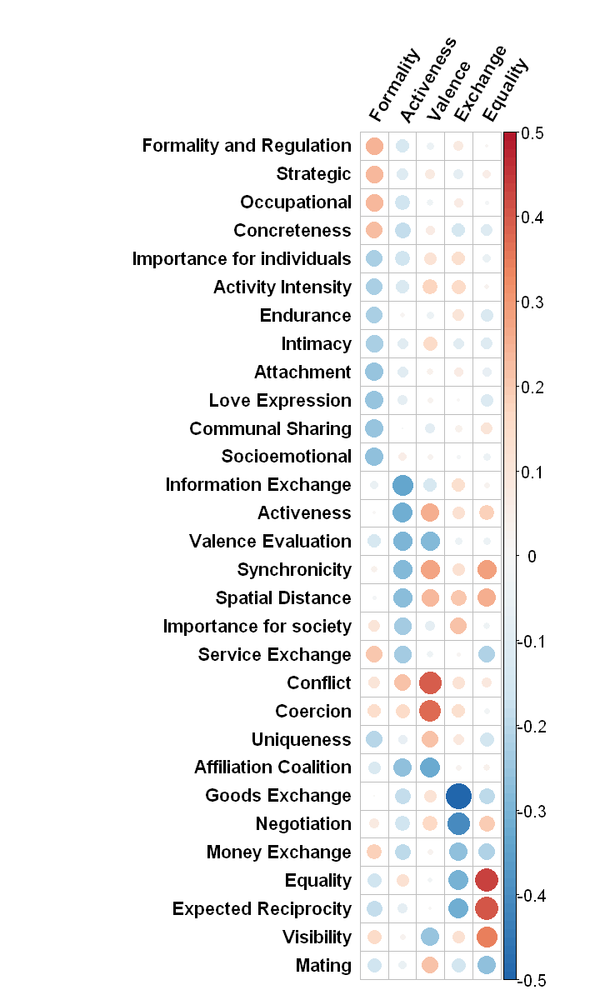

In [7]:
options(repr.plot.width=6,repr.plot.height=10)
rownames(coe_df_5d) = dimensions
loadings_var_reorder = as.data.frame(coe_df_5d[,1:5])
colnames(loadings_var_reorder) = c('Formality','Activeness','Valence','Exchange','Equality')
#filter each row's max loading, and attribute it to correspnding column.
order_list = c()
for (row in c(1:30)){
    temp_max = abs(loadings_var_reorder[row,1])
    n = 1
    for (col in c(2:5)){
        temp = abs(loadings_var_reorder[row,col])
        if (temp > temp_max){
            temp_max = temp
            n = col
        }
        
    }
    order_list[row] = n
}
loadings_var_reorder = loadings_var_reorder %>% mutate(order = order_list) %>% arrange(order)
RC1 = loadings_var_reorder %>% filter(order==1) %>% arrange(desc(Formality))
RC2 = loadings_var_reorder %>% filter(order==2) %>% arrange(Activeness)
RC3 = loadings_var_reorder %>% filter(order==3) %>% arrange(desc(Valence))
RC4 = loadings_var_reorder %>% filter(order==4) %>% arrange(Exchange)
RC5 = loadings_var_reorder %>% filter(order==5) %>% arrange(desc(Equality))

loadings_var_reorder = rbind(RC1,RC2,RC3,RC4,RC5)
loadings_var_reorder = loadings_var_reorder[1:5]

corrplot(as.matrix(loadings_var_reorder),is.corr=FALSE,
         tl.col = "black",tl.srt=60,tl.cex=1.1,family='sans',font=2,
         col.lim = c(-0.5,0.5),cl.ratio = 0.4,cl.cex=1,
         col = colorRampPalette(rev(brewer.pal(n=7,name ="RdBu")))(100))
         #col= colorRampPalette(c("white","darkred"))(100)

# Clustering

In [18]:
import warnings
warnings.filterwarnings("ignore")

In [19]:
import pandas as pd
import numpy as np

from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import ClusterWarning
from warnings import simplefilter
simplefilter("ignore", ClusterWarning)
random_seed = 2021

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from sklearn.metrics.pairwise import euclidean_distances#transform dataframe into rdm

In [20]:
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import ClusterWarning
from warnings import simplefilter
simplefilter("ignore", ClusterWarning)

def optimalK(data_type,data, algorithm1, algorithm2, title, random_state=random_seed, maxClusters=15):
    """
    Calculates optimal K using silhouette score
    Params:
        data_type: df, dissim
        data: ndarry of shape (n_samples, n_features)
        algorithm1: kmeans, kmedoids, or hierarchical
        algorithm2: kmeans, kmedoids, or hierarchical
        title: the title for the resulting figure
        maxClusters: Maximum number of clusters to test for
    Returns: (silh, optimalK)
    """
    simplefilter("ignore", ClusterWarning)
    silh = np.zeros((len(range(1, maxClusters)),))
    resultsdf = pd.DataFrame({'algorithm':[], 'clusterCount':[], 'silhouette':[]})
    for algorithm in [algorithm1, algorithm2]:
        for index, k in enumerate(range(2, maxClusters)):

            # Fit cluster to original data and create dispersion
            ####################################################
            ###based on type of data, choose corresponding model
            ####################################################
            if algorithm == 'kmeans':
                model = KMeans(k, random_state=random_state)
                model.fit(data)
            if algorithm == 'kmedoids':
                model = KMedoids(n_clusters=k, metric="euclidean",
                                 random_state=random_state)
                model.fit(data)
            if algorithm == 'hierarchical':
                model = AgglomerativeClustering(n_clusters=k,linkage = 'average')
                model.fit(data)

            cluster_labels = model.fit_predict(data)
            silhouette_avg = silhouette_score(data, cluster_labels)
            
            ###############################################################################################
            ###When the Dissimilar Matrix is inputted in Clustering function,"precomputed" should be stated 
            ###############################################################################################
            if data_type == 'dissim':
                #Kmeans hasn't "precomputed"
                if algorithm == 'kmedoids':
                    model = KMedoids(n_clusters=k, metric="precomputed",
                                 random_state=random_state)
                    model.fit(data)
                #Metric used to compute the linkage. Can be “euclidean”, “l1”, “l2”, “manhattan”, “cosine”, or “precomputed”.
                #If linkage is “ward”, only “euclidean” is accepted. 
                #If “precomputed”, a distance matrix (instead of a similarity matrix) is needed as input for the fit method.
                #When "precomputed" was setted in affinity, linkage is unable to use "ward", so "average" is setted.
                if algorithm == 'hierarchical':
                    model = AgglomerativeClustering(n_clusters=k,affinity = 'precomputed',linkage = 'average')                
                    model.fit(data)
                    
                #Fit and return the result of each sample's clustering assignment.
                cluster_labels = model.fit_predict(data)
                silhouette_avg = silhouette_score(data, cluster_labels, metric = "precomputed")                                
            
            
            resultsdf = resultsdf.append({'algorithm':algorithm, 'clusterCount':k, 
                                          'silhouette':silhouette_avg}, ignore_index=True)
    
    algorithm1_df = resultsdf[resultsdf['algorithm']==algorithm1]
    algorithm2_df = resultsdf[resultsdf['algorithm']==algorithm2]
    
    # Plot the silhouette scores for each algorithm
    plt.figure(figsize=(7,4),dpi=300)
    plt.xlim(1,15)
    sns.lineplot(data=resultsdf, x="clusterCount", y="silhouette", hue="algorithm")
    # Indicate the best k for each algorithm
    plt.scatter(algorithm1_df.loc[algorithm1_df['silhouette'].idxmax(),'clusterCount'], 
                algorithm1_df['silhouette'].max())
    plt.scatter(algorithm2_df.loc[algorithm2_df['silhouette'].idxmax(),'clusterCount'], 
                algorithm2_df['silhouette'].max())
    plt.xlabel('Cluster Count')
    plt.ylabel('Silhouette Value')
    plt.title(title)
    
    return (plt)  # Plus 1 because index of 0 means 1 cluster is optimal, index 2 = 3 clusters are optimal

In [5]:
def create_cluster_models(data_type, data, methods, ks, keep_orig=False):
    """Only use kmeans or kmedoids. Using both clustering methods will results in overwritten data. 
    Only kmeans will be returned"""
    
    ###############################################################################################
    ###When the Dissimilar Matrix is inputted in Clustering function,"precomputed" should be stated 
    ###############################################################################################   
    if data_type == 'dissim':
        clust_results = pd.DataFrame(index=data.index)
        for k in ks:
            for m in methods:
                if m == "KMedoids":
                    # KMedoids clustering
                    fit_cluster = KMedoids(n_clusters=k, metric='precomputed', 
                                              random_state=random_seed).fit(data)
                    # Cluster labels for each point.
                    clust_results['cl_k'+str(k)] = fit_cluster.labels_

                #Kmeans hasn't "precomputed"

                elif m == "Hierarchical":
                    # Hierarchical clustering
                    fit_cluster = AgglomerativeClustering(n_clusters=k,affinity = 'precomputed',linkage = 'average').fit(data)
                    clust_results['cl_h'+str(k)] = fit_cluster.labels_        

    if data_type == 'df':
        if keep_orig == True:
            clust_results = data.loc[:]
        else:
            clust_results = pd.DataFrame(index=data.index)

        for k in ks:
            for m in methods:
                if m == "KMedoids":
                    # KMedoids clustering
                    fit_cluster = KMedoids(n_clusters=k, metric='euclidean', 
                                              random_state=random_seed).fit(data)
                    clust_results['cl_k'+str(k)] = fit_cluster.labels_

                elif m == "KMeans":
                    # KMeans clustering
                    fit_cluster = KMeans(n_clusters=k, random_state=random_seed).fit(data)
                    clust_results['cl_k'+str(k)] = fit_cluster.labels_

                elif m == "Hierarchical":
                    # Hierarchical clustering
                    fit_cluster = AgglomerativeClustering(n_clusters=k,linkage = 'average').fit(data)
                    clust_results['cl_h'+str(k)] = fit_cluster.labels_

    return clust_results

## pca_var + KMeans(M7)

<module 'matplotlib.pyplot' from 'C:\\Users\\10563\\AppData\\Roaming\\Python\\Python39\\site-packages\\matplotlib\\pyplot.py'>

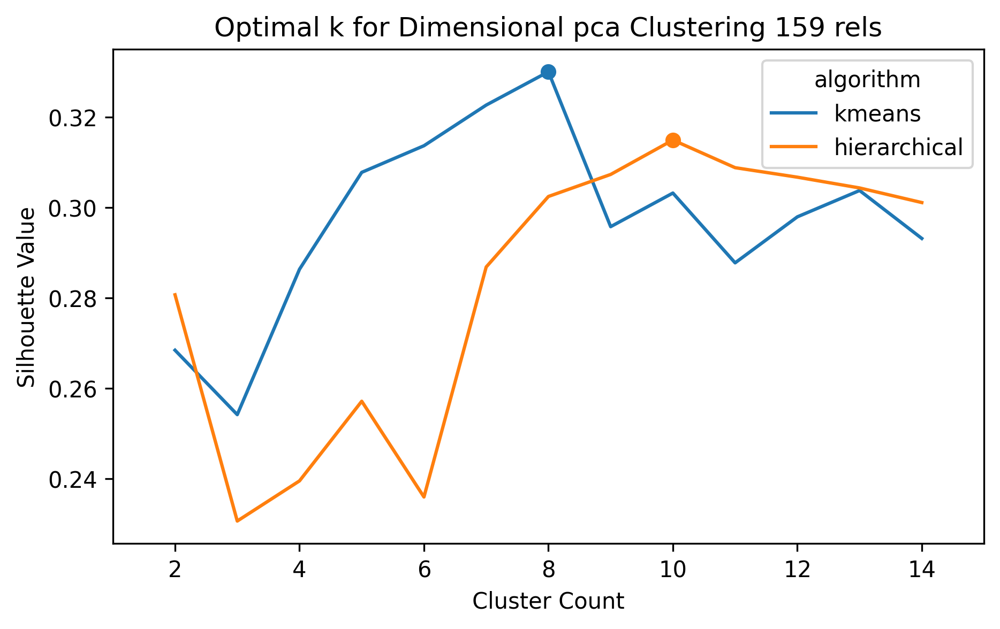

In [5]:
Within_pca_5c = pd.read_csv('../output_data/group/dimension/within_scores_var.csv',index_col = 0)
optimalK(data_type='df',data=Within_pca_5c, algorithm1='kmeans', algorithm2='hierarchical', 
         random_state=random_seed, title="Optimal k for Dimensional pca Clustering 159 rels")

### KMeans

In [6]:
data = Within_pca_5c
ks = [3,5,6,7]
clust_results = data
for k in ks:
    model = KMeans(k, random_state=random_seed)
    model.fit(data)
    cluster_labels = model.fit_predict(data)
    clust_results['cl_k'+str(k)] = cluster_labels
clust_results.to_csv('../output_data/group/dimension/within_cluster_results.csv')

In [7]:
for n in range(len(clust_results['cl_k3'].unique())):
    each_cluster = clust_results.index[clust_results['cl_k3']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*clust_results.index[clust_results['cl_k3']==n], sep = ", ")


Cluster 1 Relationship:71
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and lawyer, police officer 

### Plot M7

#### interactive

In [2]:
import plotly
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import pandas as pd

In [3]:
pca_5c_3k = pd.read_csv('../output_data/group/dimension/within_cluster_results.csv',
                       index_col=0,usecols=range(0,7))

pca_5c_3k.columns = ['Formality','Activeness','Valence','Exchange','Equality','cl_k3'] 
pca_5c_3k['Exchange'] = -pca_5c_3k['Exchange']
#pca_5c_3k['Equality'] = -pca_5c_3k['Equality']

# transform into range[0,1]
Equality_values = pca_5c_3k['Equality']
Exchange_values = pca_5c_3k['Exchange']
pca_5c_3k['Equality_plot'] = (Equality_values -Equality_values.min())/(Equality_values.max()-Equality_values.min())
pca_5c_3k['Exchange_plot'] = (Exchange_values -Exchange_values.min())/(Exchange_values.max()-Exchange_values.min())

pca_5c_3k['rel'] = pca_5c_3k.index
pca_5c_3k.loc[pca_5c_3k['cl_k3']==0,'cluster'] = 'Public'
pca_5c_3k.loc[pca_5c_3k['cl_k3']==1,'cluster'] = 'Private'
pca_5c_3k.loc[pca_5c_3k['cl_k3']==2,'cluster'] = 'Hostile'

pca_5c_3k.head()

,Formality,Activeness,Valence,Exchange,Equality,cl_k3,Equality_plot,Exchange_plot,rel,cluster
parent and child,-1.957735,0.310987,0.397086,-0.276676,0.953168,1,0.758366,0.198732,parent and child,Private
parent and teenager,-1.759764,0.260393,-0.037582,-0.290981,0.785157,1,0.715948,0.195951,parent and teenager,Private
wife and husband,-2.012441,0.563185,0.430510,0.332437,-0.447899,1,0.404638,0.317159,wife and husband,Private
fiance and fiancee,-1.868028,0.720521,0.408365,0.322062,-0.625037,1,0.359916,0.315141,fiance and fiancee,Private
siblings,-0.981572,0.722294,0.509632,-0.789377,-0.933325,1,0.282083,0.099050,siblings,Private


In [4]:
fig = px.scatter_3d(pca_5c_3k,x='Activeness',y='Formality',z='Valence',
                    color='cluster',size='Equality_plot',size_max=70,
                    color_discrete_sequence=["#E45E62","#6594BE","#4EC186"],
                    #symbol='cluster',
                    #symbol_sequence= ['cross','square','circle'],
                    hover_name="rel",
                    hover_data={#'cl_k3':False, # remove species from hover data
                                'Equality_plot':False,
                                'Formality':':.2f','Activeness':':.2f',
                                'Valence':':.2f','Exchange':':.2f','Equality':':.2f'})

#fig.update_scenes(xaxis_autorange="reversed")
#fig.update_scenes(zaxis_autorange="reversed")
# xaxis.backgroundcolor is used to set background color
fig.update_layout(scene = dict(
                    # Formality
#                     xaxis = dict(
#                          backgroundcolor="#4EC186",
#                          #gridcolor="#4EC186",
#                          showgrid=False,zeroline=False,
#                          showbackground=True,
#                          zerolinecolor="white",),
#                     # Activeness
#                     yaxis = dict(
#                         backgroundcolor="#E45E62",
#                         #gridcolor="#E45E62",
#                         showgrid=False,zeroline=False,
#                         showbackground=True,
#                         zerolinecolor="white"),
#                     zaxis = dict(
#                         backgroundcolor="#6594BE",
#                         #gridcolor="#6594BE",
#                         showgrid=False,zeroline=False,
#                         showbackground=True,
#                         zerolinecolor="white",),
                        ),
                    # legend
                  legend=dict(#font=dict(size= 20),
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01),  
                  
                    width=1000,height=1000,
                    font_size =20
#                     margin=dict(
#                     r=10, l=100,
#                     b=20, t=15),
                  #showlegend=True
                  )                    

In [6]:
plotly.offline.plot(fig,filename='../output_graph/ModelInTasks/model7.html')

'../output_graph/ModelInTasks/model7.html'

#### static

In [5]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

In [6]:
def get_cube(limits=None):
    """get the vertices, edges, and faces of a cuboid defined by its limits

    limits = np.array([[x_min, x_max],
                       [y_min, y_max],
                       [z_min, z_max]])
    """
    v = np.array([[0, 0, 0], [0, 0, 1],
                  [0, 1, 0], [0, 1, 1],
                  [1, 0, 0], [1, 0, 1],
                  [1, 1, 0], [1, 1, 1]], dtype=int)

    if limits is not None:
        v = limits[np.arange(3)[np.newaxis, :].repeat(8, axis=0), v]

    e = np.array([[0, 1], [0, 2], [0, 4],
                  [1, 3], [1, 5],
                  [2, 3], [2, 6],
                  [3, 7],
                  [4, 5], [4, 6],
                  [5, 7],
                  [6, 7]], dtype=int)

    f = np.array([[0, 2, 3, 1],
                  [0, 4, 5, 1],
                  [0, 4, 6, 2],
                  [1, 5, 7, 3],
                  [2, 6, 7, 3],
                  [4, 6, 7, 5]], dtype=int)

    return v, e, f

In [7]:
print(pca_5c_3k['Activeness'].max(),pca_5c_3k['Activeness'].min())
print(pca_5c_3k['Formality'].max(),pca_5c_3k['Formality'].min())
print(pca_5c_3k['Valence'].max(),pca_5c_3k['Valence'].min())

1.64841639263021 -3.41213726631946
1.48899053846965 -2.48307264098223
1.12081780093567 -2.91797911921426


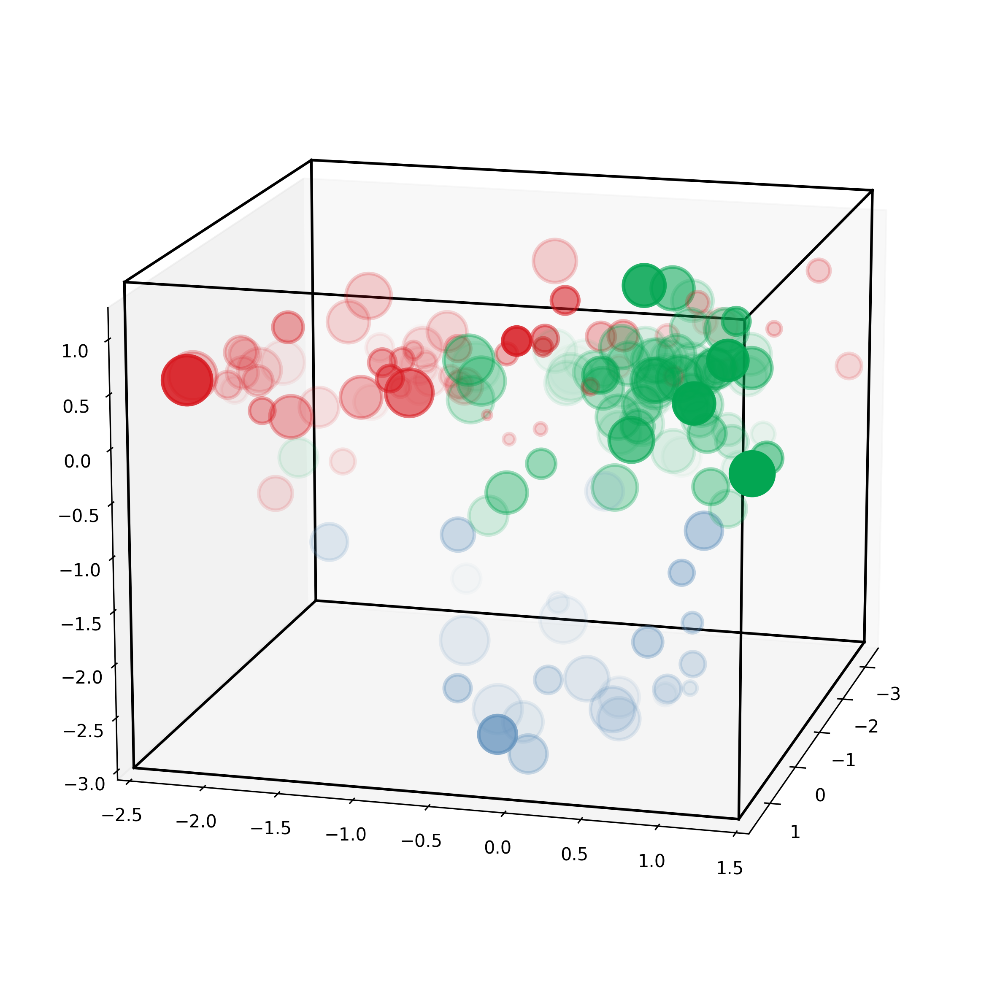

In [8]:
fig = plt.figure(figsize=(10,10),dpi=300)
ax = plt.axes(projection='3d')
mycolor = ["#03A652","#D81920","#6594BE"]
cmaps = mpl.colors.LinearSegmentedColormap.from_list('mylist',mycolor,N=3)

ax.scatter3D(pca_5c_3k['Activeness'],pca_5c_3k['Formality'], pca_5c_3k['Valence'], 
             s=pca_5c_3k['Equality_plot']*800, c=pca_5c_3k['cl_k3'],
             alpha = pca_5c_3k['Exchange_plot'],
             linewidth = 2,
             cmap = cmaps)
ax.set_xlim(-3.5,1.7)
ax.set_ylim(-2.5,1.5)
ax.set_zlim(-3,1.2)

ax.view_init(15, 15)

# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')

# Bonus: To get rid of the grid as well:
ax.grid(False)

#ax.set_axis_off()


limits = np.array([[-3.5,1.7],
                   [-2.5,1.5],
                   [-3,1.5]])

v, e, f = get_cube(limits)

for i, j in e:
    ax.plot(*v[[i, j], :].T, color='black', ls='-')

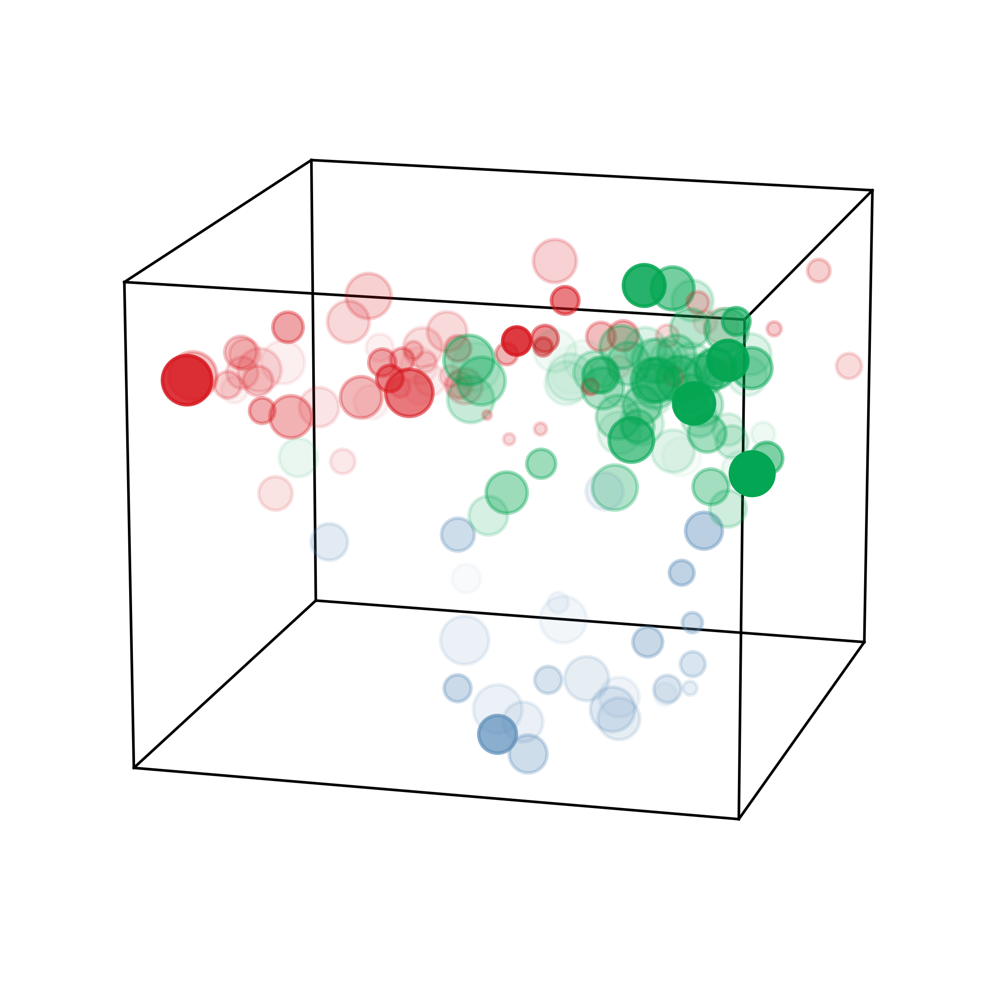

In [9]:
fig = plt.figure(figsize=(10,10),dpi=300)
ax = plt.axes(projection='3d')
mycolor = ["#03A652","#D81920","#6594BE"]
cmaps = mpl.colors.LinearSegmentedColormap.from_list('mylist',mycolor,N=3)

ax.scatter3D(pca_5c_3k['Activeness'],pca_5c_3k['Formality'], pca_5c_3k['Valence'], 
             s=pca_5c_3k['Equality_plot']*800, c=pca_5c_3k['cl_k3'],
             alpha = pca_5c_3k['Exchange_plot'],
             linewidth = 2,
             cmap = cmaps)
ax.set_xlim(-3.5,1.7)
ax.set_ylim(-2.5,1.5)
ax.set_zlim(-3,1.2)

ax.view_init(15, 15)

# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')

# Bonus: To get rid of the grid as well:
ax.grid(False)

ax.set_axis_off()


limits = np.array([[-3.5,1.7],
                   [-2.5,1.5],
                   [-3,1.5]])

v, e, f = get_cube(limits)

for i, j in e:
    ax.plot(*v[[i, j], :].T, color='black', ls='-')

### Hierarchical

In [8]:
data = Within_pca_5c
ks = [3,5,6,7]
clust_results_hierarchial = data
for k in ks:
    model = AgglomerativeClustering(n_clusters=k,linkage = 'average').fit(data)
    model.fit(data)
    cluster_labels = model.fit_predict(data)
    clust_results_hierarchial['cl_h'+str(k)] = cluster_labels
    
for n in range(len(clust_results_hierarchial['cl_h3'].unique())):
    each_cluster = clust_results_hierarchial.index[clust_results_hierarchial['cl_h3']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*clust_results_hierarchial.index[clust_results_hierarchial['cl_h3']==n], sep = ", ")


Cluster 1 Relationship:68
parent and child, parent and teenager, wife and husband, fiance and fiancee, siblings, a person and their in laws, close friends, casual acquaintances, teammates in sports, second cousins, grandparent and grandchild, foster parent and foster child, godparent and godchild, step grandparent and step grandchild, ancestor and descendant, man and his mistress, step siblings, distant relatives, twins, a person and their family friends, religious followers, reader and writer, man and god, peers, classmates, bride and bridesmaid, a person and their social media follower, childhood friends, pen friends, friends with benefits, life partners, soul mates, church members, fans of the same sports team, cousins, parent and infant, step parent and step child, bride and groom, brother and sister, close relatives, a person and their deceased spouse, roommates, sorority sisters, fraternity brothers, groom and groomsman, predecessor and successor, celebrity and fans, celebrity a

## raw data + KMeans

### KMeans 

<module 'matplotlib.pyplot' from 'C:\\Users\\10563\\AppData\\Roaming\\Python\\Python39\\site-packages\\matplotlib\\pyplot.py'>

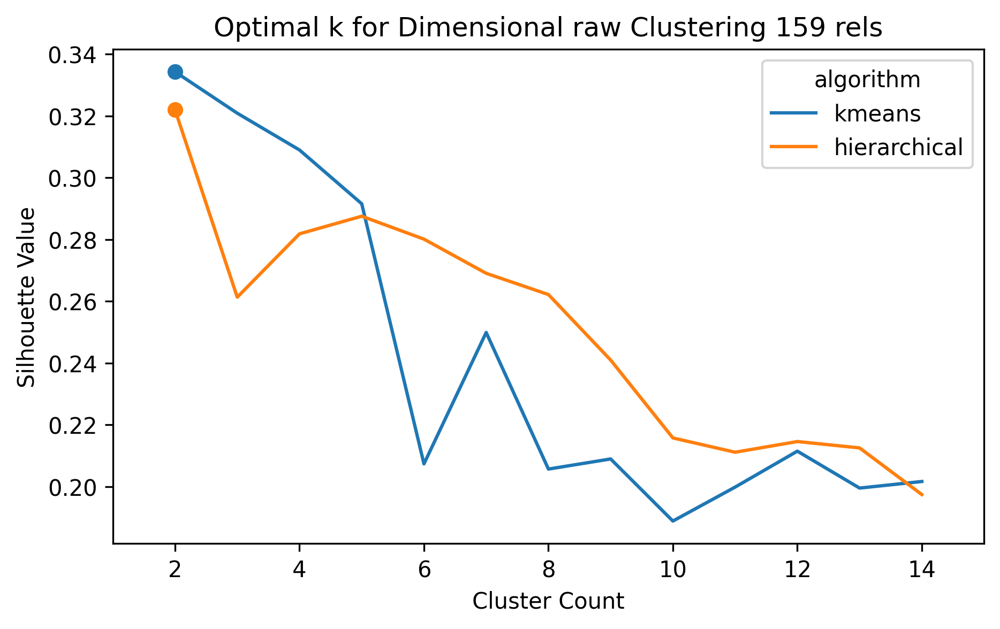

In [11]:
Within_raw_30d = pd.read_csv('../output_data/group/dimension/within_dim_rel_scaled.csv',
                            index_col=0)
optimalK(data_type='df',data=Within_raw_30d, algorithm1='kmeans', algorithm2='hierarchical', 
         random_state=random_seed, title="Optimal k for Dimensional raw Clustering 159 rels")

In [12]:
Within_raw_30d = pd.read_csv('../output_data/group/dimension/within_dim_rel_scaled.csv',
                        index_col = 0)
data = Within_raw_30d
ks = [2,3,4,5]
clust_results = data
for k in ks:
    model = KMeans(k, random_state=random_seed)
    model.fit(data)
    cluster_labels = model.fit_predict(data)
    clust_results['cl_k'+str(k)] = cluster_labels
clust_results.to_csv('../output_data/group/dimension/within_cluster_results_raw.csv')

In [13]:
for n in range(len(clust_results['cl_k3'].unique())):
    each_cluster = clust_results.index[clust_results['cl_k3']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*clust_results.index[clust_results['cl_k3']==n], sep = ", ")


Cluster 1 Relationship:31
divorced spouses, guard and prisoner, opposing negotiators, political opponents, business rivals, enemies, master and servant, casual acquaintances, victim and witness, criminal and police officer, criminal and prosecutor, bully and victim, a person and their social media follower, fans of opposing sports teams, victim and criminal, criminal and hostage, defendant and plaintiff, police officer and offender, police officer and civilian, parole officer and parolee, slave and master, sports rivals, romantic rivals, celebrity and haters, native and tourist, facebook friends, ex lovers, strangers, frenemies, alumni, competitors in sports

Cluster 2 Relationship:60
parent and child, parent and teenager, wife and husband, fiance and fiancee, siblings, a person and their in laws, close friends, teammates in sports, second cousins, grandparent and grandchild, foster parent and foster child, godparent and godchild, step grandparent and step grandchild, ancestor and des

Cluster1 = Hostile    
Cluster2 = Private      
Cluster3 = Occupational        

### Hierarchical

In [14]:
data = Within_raw_30d
ks = [3,5,6,7]
clust_results_hierarchial = data
for k in ks:
    model = AgglomerativeClustering(n_clusters=k,linkage = 'average').fit(data)
    model.fit(data)
    cluster_labels = model.fit_predict(data)
    clust_results_hierarchial['cl_h'+str(k)] = cluster_labels
    
for n in range(len(clust_results_hierarchial['cl_h3'].unique())):
    each_cluster = clust_results_hierarchial.index[clust_results_hierarchial['cl_h3']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*clust_results_hierarchial.index[clust_results_hierarchial['cl_h3']==n], sep = ", ")


Cluster 1 Relationship:91
divorced spouses, employer and employee, interviewer and job applicant, guard and prisoner, nurse and patient, therapist and patient, salesperson and customer, business partners, opposing negotiators, political opponents, business rivals, enemies, teacher and student, professor and graduate student, master and servant, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, criminal and police officer, criminal and prosecutor, customer and businessman, representative and citizen, officer and soldier, reviewer and writer, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, bully and victim, fans of opposing sports teams, superior and subordinate, a mona

## t-SNE + KMeans

In [15]:
from sklearn.manifold import TSNE
random_s=4

In [16]:
Within_raw_30d = pd.read_csv('../output_data/group/dimension/within_dim_rel_scaled.csv',
                        index_col = 0)
data = Within_raw_30d

In [17]:
dim_rel_scaled = Within_raw_30d
tsne_model_p05 = TSNE(n_components=2, perplexity=5,
                     random_state=random_s).fit_transform(dim_rel_scaled)
tsne_model_p05 = pd.DataFrame(tsne_model_p05, columns=['Dim1','Dim2'],
                              index=dim_rel_scaled.index)

<module 'matplotlib.pyplot' from 'C:\\Users\\10563\\AppData\\Roaming\\Python\\Python39\\site-packages\\matplotlib\\pyplot.py'>

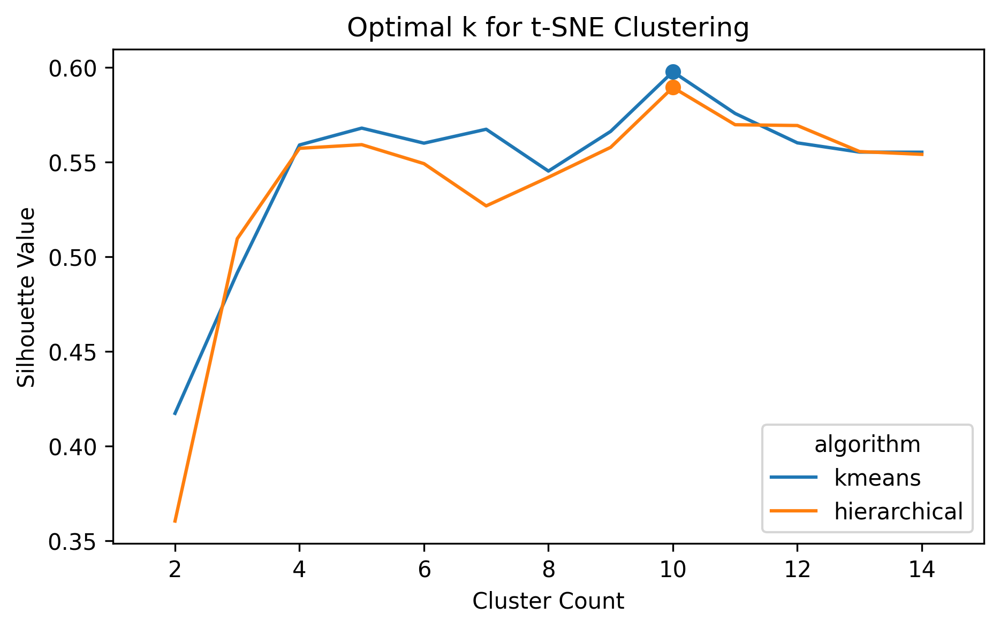

In [18]:
optimalK(data_type='df',data=tsne_model_p05, algorithm1='kmeans', algorithm2='hierarchical', 
         random_state=random_s, title="Optimal k for t-SNE Clustering")

In [19]:
tsne_results = create_cluster_models(data_type = "df",data = tsne_model_p05,
                                       methods=['KMeans', 'Hierarchical'],ks=[6,7],keep_orig=True)

In [20]:
for n in range(len(tsne_results['cl_k6'].unique())):
    each_cluster = tsne_results.index[tsne_results['cl_k6']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*tsne_results.index[tsne_results['cl_k6']==n], sep = ", ")


Cluster 1 Relationship:54
interviewer and job applicant, nurse and patient, therapist and patient, business partners, teacher and student, professor and graduate student, union leader and union member, victim and witness, representative and citizen, officer and soldier, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and lawyer, police officer and civilian, consultant and client, doctor and patient, doctor and nurse, patient and caretaker, driver and passenger, coach and athlete, team captain and team members, club member and club president, politician and

## UMAP + KMeans(M3)

In [28]:
import umap.umap_ as umap
from sklearn.manifold import TSNE
random_s=4

In [22]:
dim_rel_scaled = pd.read_csv('../output_data/group/dimension/within_dim_rel_scaled.csv',index_col = 0)

neighbors = [5,10,15,20]
dists = [0.001, 0.01,0.1]

umaps_results = pd.DataFrame(columns=['neighbor','distance','Dim1','Dim2'])
for n in neighbors:
    for d in dists:
        temp_umap = umap.UMAP(n_neighbors=n, min_dist=d, n_components=2,
                              random_state=random_s).fit_transform(dim_rel_scaled)
        temp_umap = pd.DataFrame(temp_umap, columns=['Dim1','Dim2'])
        temp_umap['neighbor'] = n
        temp_umap['distance'] = d
        umaps_results = umaps_results.append(temp_umap, sort=True, 
                                             ignore_index=True)

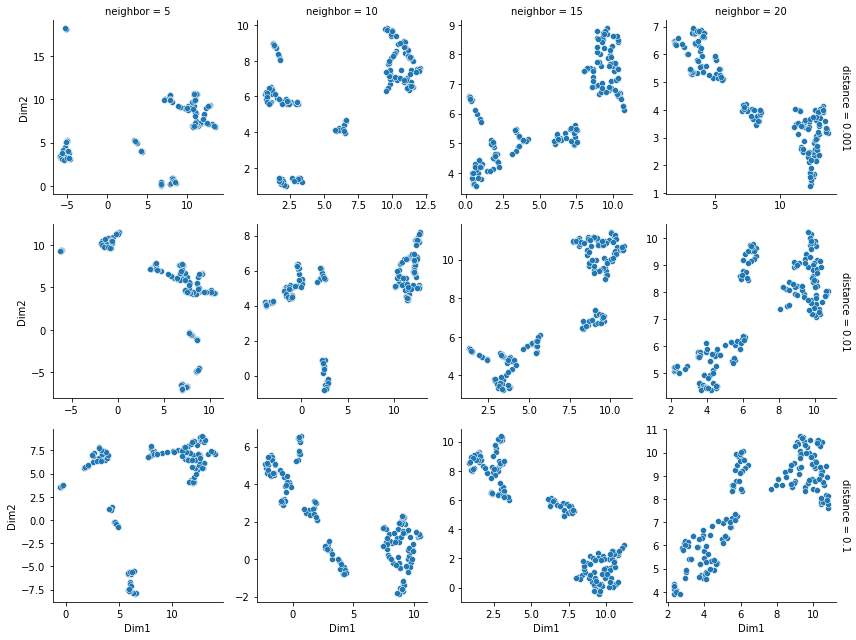

In [23]:
g = sns.FacetGrid(umaps_results, row='distance', col='neighbor',
                  margin_titles=True, sharex=False, sharey=False)
g.map(sns.scatterplot, 'Dim1', 'Dim2')

In [24]:
resultdf = pd.DataFrame({'dist':[],'ngbr':[], 'clusterCount':[], 'silhouette':[]})
for dist in [0.001, 0.01,0.1]:
    for ngbr in [5,10,15,20]:
        df_subset = umaps_results[(umaps_results['distance']==dist) & \
                                      (umaps_results['neighbor']==ngbr)].iloc[:,:2]
        for k in range(2,8):
            model = KMeans(k, random_state=random_seed)
            model.fit(df_subset)
            cluster_labels = model.fit_predict(df_subset)
            silhouette_avg = silhouette_score(df_subset, cluster_labels)
            
            resultdf = resultdf.append({'dist':dist,'ngbr':ngbr,'clusterCount':k,
                             'silhouette':silhouette_avg},ignore_index=True)  

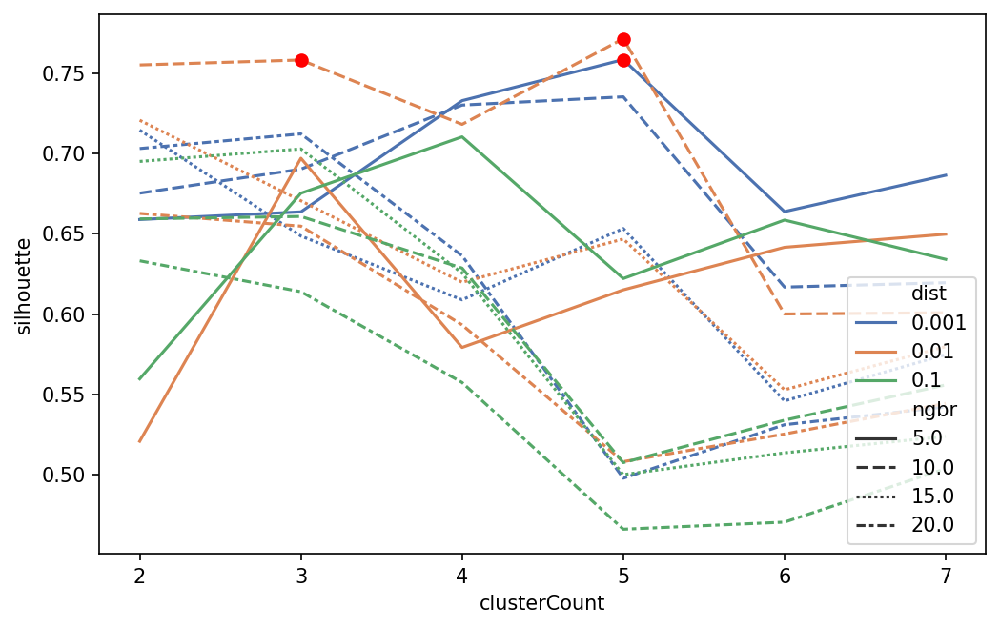

In [25]:
plt.figure(figsize = (8,5),dpi=150)
top_5_indices = resultdf['silhouette'].nlargest(5).index
sns.lineplot(data=resultdf, x='clusterCount', y='silhouette',hue='dist',style='ngbr',palette="deep")
max_idx = resultdf['silhouette'].idxmax()
plt.plot(resultdf.loc[top_5_indices[0], 'clusterCount'], resultdf.loc[top_5_indices[0], 'silhouette'], 
         marker='o', color='red')
plt.plot(resultdf.loc[top_5_indices[1], 'clusterCount'], resultdf.loc[top_5_indices[1], 'silhouette'], 
         marker='o', color='red')
plt.plot(resultdf.loc[top_5_indices[2], 'clusterCount'], resultdf.loc[top_5_indices[2], 'silhouette'], 
         marker='o', color='red')
plt.legend(loc='lower right')

In [29]:
resultdf_tsne = pd.DataFrame({'perplex':[], 'clusterCount':[], 'silhouette':[]})
for perplex in range(5,55,5):
    df_subset = TSNE(n_components=2, perplexity=perplex, random_state=random_s).\
                fit_transform(dim_rel_scaled)
    for k in range(2,8):
        model = KMeans(k, random_state=random_s)
        model.fit(df_subset)
        cluster_labels = model.fit_predict(df_subset)
        silhouette_avg = silhouette_score(df_subset, cluster_labels)

        resultdf_tsne = resultdf_tsne.append({'perplex':perplex,'clusterCount':k,
                         'silhouette':silhouette_avg},ignore_index=True)  

<AxesSubplot:xlabel='clusterCount', ylabel='silhouette'>

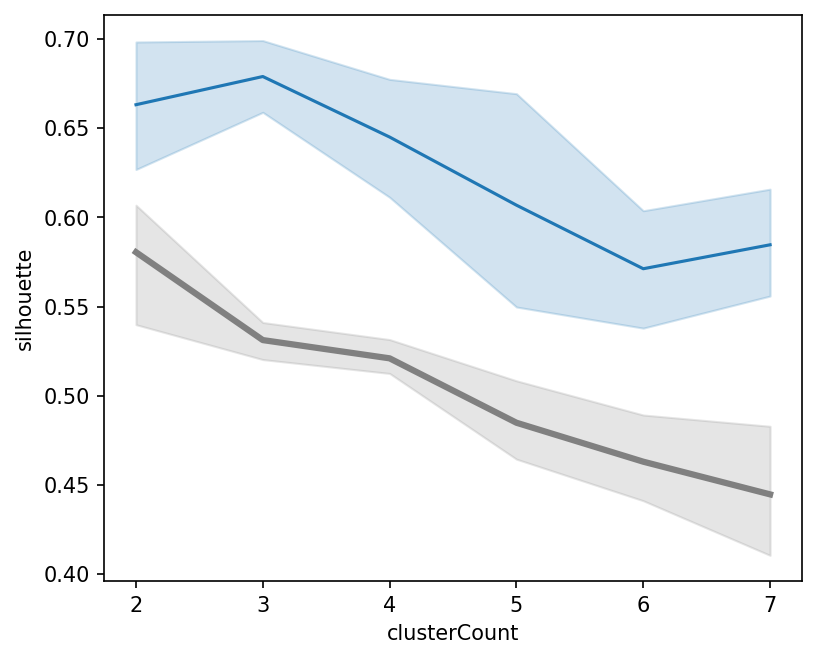

In [31]:
plt.figure(figsize = (6,5),dpi=150)
sns.lineplot(data=resultdf, x='clusterCount', y='silhouette')
sns.lineplot(data=resultdf_tsne, x='clusterCount', y='silhouette',linewidth = 3,color="grey")

In [19]:
#umap_final = umaps_results[(umaps_results['neighbor']==15) & (umaps_results['distance']==0.01)][['Dim1','Dim2']]

# umap_final = umap.UMAP(n_neighbors=10, min_dist=0.01, n_components=2,
#                       random_state=random_seed).fit_transform(dim_rel_scaled)

# umap_final = pd.DataFrame(umap_final, columns=['Dim1','Dim2'], index=dim_rel_scaled.index)

# optimalK(data_type='df',data=umap_final, algorithm1='kmeans', algorithm2='hierarchical', 
#          random_state=random_s, title="Optimal k for UMAP Clustering")

In [21]:
umap_final = umap.UMAP(n_neighbors=10, min_dist=0.01, n_components=2,
                      random_state=random_seed).fit_transform(dim_rel_scaled)
umap_final = pd.DataFrame(umap_final, columns=['Dim1','Dim2'], index=dim_rel_scaled.index)

umap_results = create_cluster_models(data_type = "df",data = umap_final,
                                       methods=['KMeans', 'Hierarchical'],ks=[2,3,4,5,6],keep_orig=True)
umap_results.to_csv('../output_data/group/dimension/within_cluster_results_umap.csv')

for n in range(len(umap_results['cl_k6'].unique())):
    each_cluster = umap_results.index[umap_results['cl_k6']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*umap_results.index[umap_results['cl_k6']==n], sep = ", ")


Cluster 1 Relationship:38
nurse and patient, therapist and patient, business partners, teacher and student, professor and graduate student, union leader and union member, victim and witness, representative and citizen, officer and soldier, reader and writer, reviewer and writer, director and performer, psychologist and client, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, guest and host, volunteer and organizer, a monarch and their minister, police officer and civilian, doctor and patient, patient and caretaker, coach and athlete, team captain and team members, club member and club president, politician and supporter, leader and follower, babysitter and infant, religious leader and congregant, co workers, criminal and their accomplice, diplomats, principal and teacher, mentor and mentee, predecessor and successor, celebrity and fans, native and tourist, political allies

Cluster 2 Relationship:15
casual acquaintances, second c

In [22]:
for n in range(len(umap_results['cl_k5'].unique())):
    each_cluster = umap_results.index[umap_results['cl_k5']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*umap_results.index[umap_results['cl_k5']==n], sep = ", ")


Cluster 1 Relationship:52
parent and child, parent and teenager, siblings, a person and their in laws, close friends, casual acquaintances, teammates in sports, second cousins, grandparent and grandchild, foster parent and foster child, godparent and godchild, step grandparent and step grandchild, ancestor and descendant, step siblings, distant relatives, twins, a person and their family friends, religious followers, man and god, peers, classmates, bride and bridesmaid, a person and their social media follower, childhood friends, pen friends, church members, fans of the same sports team, cousins, parent and infant, step parent and step child, brother and sister, close relatives, a person and their deceased spouse, roommates, sorority sisters, fraternity brothers, groom and groomsman, friends, facebook friends, strangers, neighbors, aunt and niece/nephew, uncle and niece/nephew, half siblings, adoptive parents and adopted kids, mother and infant, alumni, confidants, companions, playmat

In [23]:
for n in range(len(umap_results['cl_k4'].unique())):
    each_cluster = umap_results.index[umap_results['cl_k4']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*umap_results.index[umap_results['cl_k4']==n], sep = ", ")


Cluster 1 Relationship:72
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and law

In [24]:
for n in range(len(umap_results['cl_k3'].unique())):
    each_cluster = umap_results.index[umap_results['cl_k3']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*umap_results.index[umap_results['cl_k3']==n], sep = ", ")


Cluster 1 Relationship:72
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and law

### Heatmap

In [3]:
rels_simple = pd.read_csv('../input_data/Rel_labels/labels_different_versions.csv',index_col=0)
rels_simple_zipped = zip(rels_simple['two'],rels_simple['common'])
rels_simple_mapped = {key:value for key,value in rels_simple_zipped}

In [4]:
clust_results = pd.read_csv('../output_data/group/dimension/within_cluster_results_umap.csv',index_col=0)
clust_results.index = clust_results.index.map(rels_simple_mapped)

umap_df = pd.DataFrame(clust_results['cl_k3'])
umap_df[umap_df['cl_k3'] == 1] = -3
umap_df[umap_df['cl_k3'] == 2] = -2
umap_df[umap_df['cl_k3'] == 0] = -1

umap_df = umap_df.sort_values(by='cl_k3')
umap = list(umap_df.index)
clust_results_order = clust_results.loc[umap,:]

#### static

<AxesSubplot: >

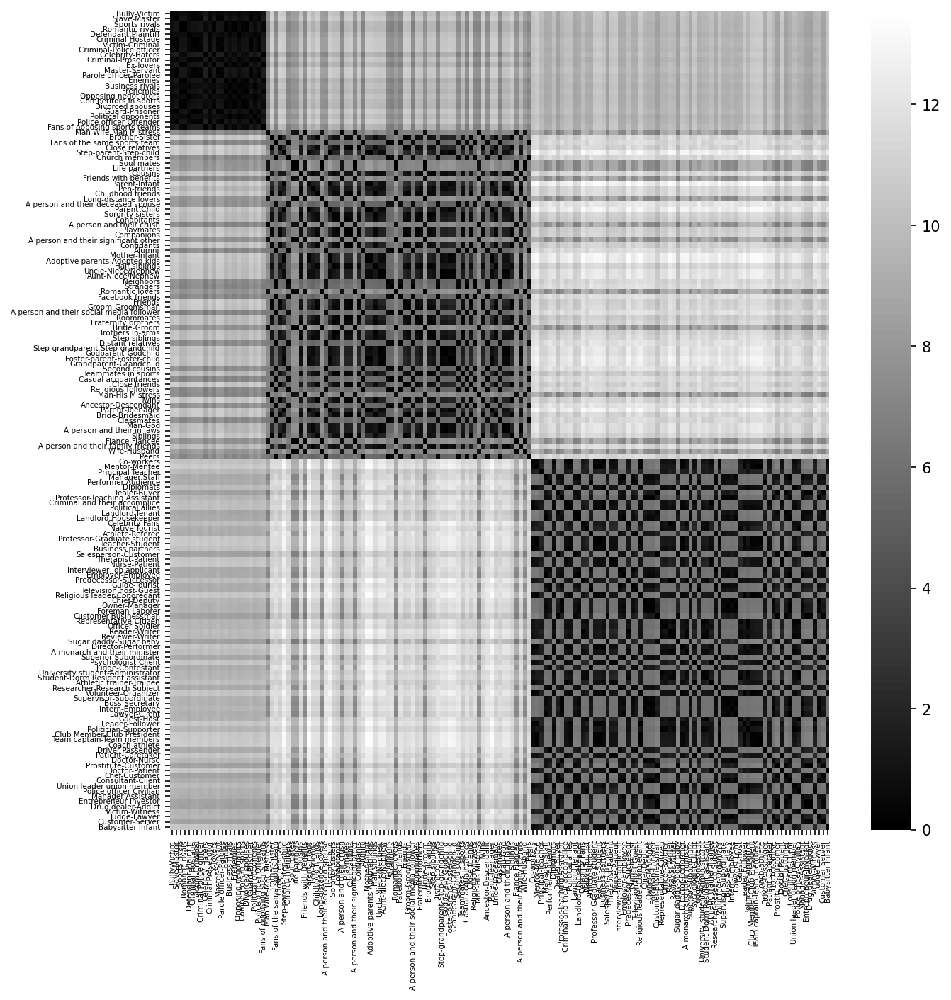

In [7]:
plt.figure(figsize=(10,10),dpi=150)
# # plt.title('RDM of Explicit task (59 participants and 159 relationships)')
plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
mycolor = ['black','grey','white']
cmaps = mpl.colors.LinearSegmentedColormap.from_list('mylist',mycolor,N=100)

dissim_pca_rdm = euclidean_distances(clust_results_order.iloc[:,0:30])
sns.heatmap(dissim_pca_rdm,xticklabels=umap,yticklabels=umap,
            cmap = cmaps)

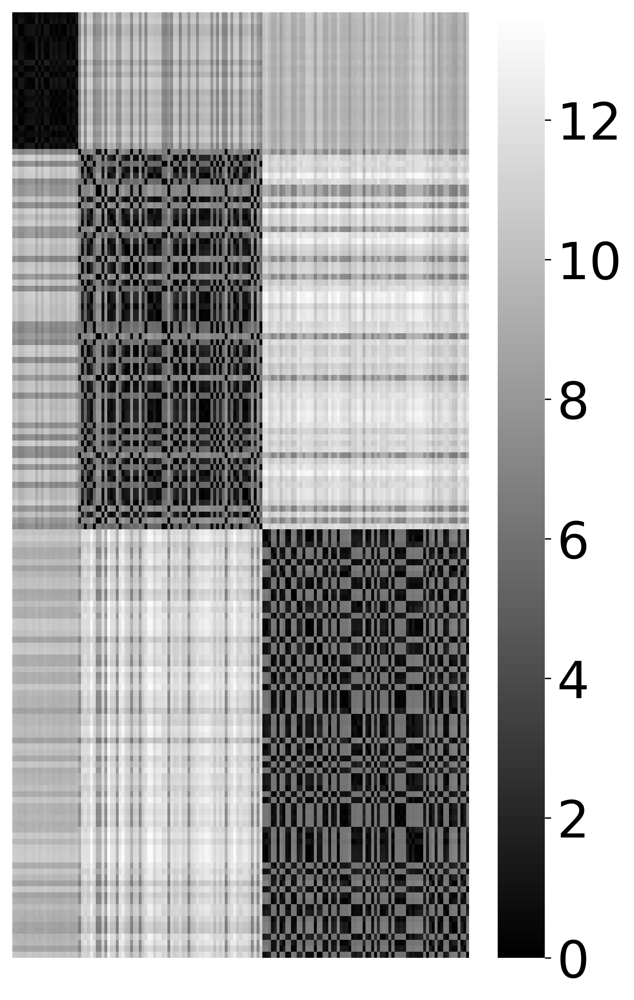

In [31]:
plt.figure(figsize=(6,10),dpi=300)
mycolor = ['black','grey','white']
cmaps = mpl.colors.LinearSegmentedColormap.from_list('mylist',mycolor,N=100)

dissim_pca_rdm = euclidean_distances(clust_results_order.iloc[:,0:30])
ax=sns.heatmap(dissim_pca_rdm,xticklabels='',yticklabels='',
            cmap = cmaps,cbar=True)
cbar=ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=30)

#### interactive

In [8]:
dissim_pca_rdm_interact = pd.DataFrame(dissim_pca_rdm,index=umap,columns=umap)
fig = px.imshow(dissim_pca_rdm_interact,
               width=450,height=750,aspect='auto',
               color_continuous_scale=["black", 'white'])
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_traces(hovertemplate='%{x}<br>%{y}<br>distance: %{z:.2f}<extra></extra>')
fig.show()

In [9]:
plotly.offline.plot(fig,filename='../output_graph/ModelInTasks/Interactive/M3.html')

'../output_graph/ModelInTasks/Interactive/M3.html'

In [32]:
for n in range(len(umap_results['cl_k2'].unique())):
    each_cluster = umap_results.index[umap_results['cl_k2']==n]
    print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
    print(*umap_results.index[umap_results['cl_k2']==n], sep = ", ")


Cluster 1 Relationship:72
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and law

## UMAP + HDBSCAN

In [32]:
import hdbscan

In [33]:
resultdf_hdb = pd.DataFrame({'dist':[],'ngbr':[], 'silhouette':[],
                             'clusterCount':[],'min_cluster_size':[],
                             'min_samples':[], 'metric':[]})
n_neighbors_list = [5, 10, 15, 20, 25]
min_dist_list = [0.001, 0.01, 0.1]

best_hdbscan_score = -1
best_hdbscan_params = {}
best_umap_params = {}

In [35]:
for n_neighbors in n_neighbors_list:
    for min_dist in min_dist_list:
        umap_embedding = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist,
                                  n_components=2,random_state=random_s).\
                            fit_transform(dim_rel_scaled)
        # change different import parameters
        min_cluster_size_list = [5, 10, 15, 20, 25]
        min_samples_list = [1, 2, 3]
        metric_list = ['euclidean', 'manhattan']

        for min_cluster_size in min_cluster_size_list:
            for min_samples in min_samples_list:
                for metric in metric_list:
                    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, 
                                                min_samples=min_samples, metric=metric)
                    cluster_labels = clusterer.fit_predict(umap_embedding)

                    # Calculate the silhouette to evaluate performance.
                    silhouette_avg = silhouette_score(umap_embedding, cluster_labels)
                    resultdf_hdb.append({'dist':min_dist,'ngbr':n_neighbors, 'silhouette':silhouette_avg,
                    'min_cluster_size':min_cluster_size, 'min_samples':min_samples, 'metric':metric},ignore_index=True)
    
                    # Select the parameter configuration with the highest silhouette coefficient.
                    if silhouette_avg > best_hdbscan_score:
                        best_hdbscan_score = silhouette_avg
                        best_hdbscan_params = {'min_cluster_size': min_cluster_size, 
                                               'min_samples': min_samples, 'metric': metric}
                        best_umap_params = {'n_neighbors': n_neighbors, 'min_dist': min_dist}

# Print the optimal parameter configuration.
print("Best UMAP Parameters:")
print(best_umap_params)
print("Best HDBSCAN Parameters:")
print(best_hdbscan_params)
print(f"Best Silhouette Score: {best_hdbscan_score}")

Best UMAP Parameters:
{'n_neighbors': 10, 'min_dist': 0.01}
Best HDBSCAN Parameters:
{'min_cluster_size': 15, 'min_samples': 1, 'metric': 'manhattan'}
Best Silhouette Score: 0.771459698677063


In [37]:
def cluster_results(result_df, method_number='cl_k5'):
    for n in range(len(result_df[method_number].unique())):
        each_cluster = result_df.index[result_df[method_number]==n]
        print("\nCluster "+str(n+1)+" Relationship:{}".format(len(each_cluster)))
        print(*result_df.index[result_df[method_number]==n], sep = ", ")

In [38]:
umap_final = umap.UMAP(n_neighbors=10, min_dist=0.01, n_components=2,
                      random_state=random_s).fit_transform(dim_rel_scaled)
umap_final = pd.DataFrame(umap_final, columns=['Dim1','Dim2'], index=dim_rel_scaled.index)

hdb_model =  hdbscan.HDBSCAN(min_cluster_size=15,min_samples=1,metric='manhattan')
cluster_labels = hdb_model.fit_predict(umap_final)

hdb_results = umap_final.copy()
hdb_results['size'] = cluster_labels
cluster_results(result_df=hdb_results, method_number='size')


Cluster 1 Relationship:72
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and law

In [42]:
hdb_model =  hdbscan.HDBSCAN(min_cluster_size=20,min_samples=3,metric='euclidean')
cluster_labels = hdb_model.fit_predict(umap_final)

hdb_results = umap_final.copy()
hdb_results['size'] = cluster_labels
cluster_results(result_df=hdb_results, method_number='size')


Cluster 1 Relationship:72
employer and employee, interviewer and job applicant, nurse and patient, therapist and patient, salesperson and customer, business partners, teacher and student, professor and graduate student, manager and staff, union leader and union member, manager and assistant, entrepreneur and investor, drug dealer and addict, victim and witness, customer and businessman, representative and citizen, officer and soldier, reader and writer, reviewer and writer, sugar daddy and sugar baby, director and performer, psychologist and client, judge and contestant, university student and administrator, student and dorm resident assistant, athletic trainer and trainee, researcher and research subject, guest and host, television host and guest, volunteer and organizer, superior and subordinate, a monarch and their minister, foreman and laborer, owner and manager, chief and deputy, supervisor and subordinate, boss and secretary, intern and employee, lawyer and client, judge and law

### Scatter plot

In [2]:
library(tidyverse)
library(ggplot2)

In [3]:
umap_dim_results_159r_all = read.csv('../output_data/group/dimension/within_cluster_results_umap.csv',
                                     row.names=1)

cluster_plot = umap_dim_results_159r_all %>% select(c('Dim1','Dim2','cl_k3'))
cluster_plot = cluster_plot %>% mutate(cluster = 
                        case_when(cl_k3==0~'Public',
                                  cl_k3==1~'Hostile',
                                  cl_k3==2~'Private'))

png 
  2

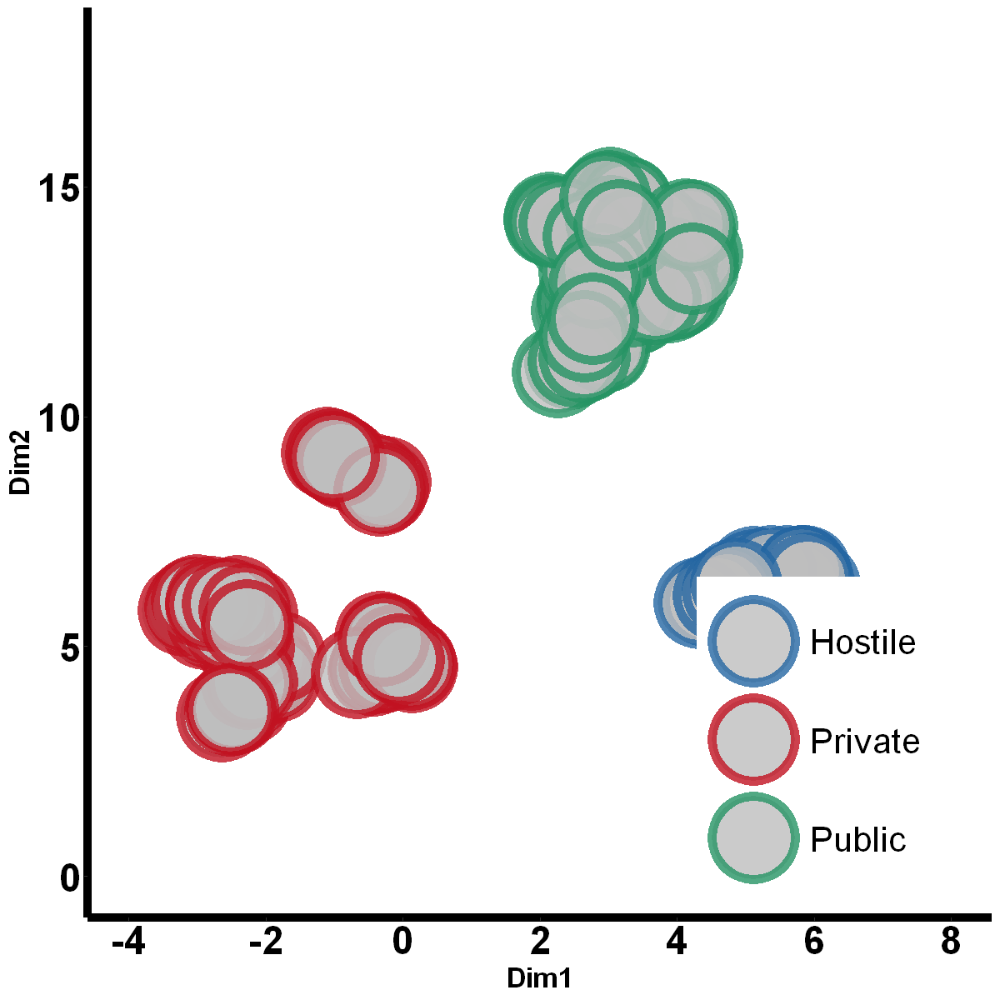

In [24]:
cluster_color=c('Hostile'='#2466A2','Private'='#C11221','Public'='#269464')

options(repr.plot.width=10, repr.plot.height=10)
ggplot(data=cluster_plot,aes(x=Dim1,y=Dim2))+
#geom_point(aes(color=cluster),size=8,stroke=1.2,shape=21)+
geom_point(aes(color=cluster),shape=21,fill='grey',
           size=25,stroke=5,alpha=0.8)+
scale_color_manual(values=cluster_color)+
scale_x_continuous(breaks=seq(-4,8,2),limits = c(-4,8))+
ylim(0,18)+
theme_bw()+
theme(panel.grid=element_blank(),
      panel.border=element_blank(),
      axis.text=element_text(size=28,face='bold',color='black'),
      axis.title.x=element_text(size=20,face='bold'),
      axis.title.y=element_text(size=20,face='bold'),
      axis.line=element_line(size=3),
      legend.position = c(0.8, 0.2),legend.key.size = unit(1.2,'cm'),
      legend.text = element_text(size = 25),
      legend.title = element_blank())


##############
png("../output_graph/ModelInTasks/Scatter_M3_revise.png", bg="transparent",
    family = 'sans',units='in',width=10,height=10,res=300)
ggplot(data=cluster_plot,aes(x=Dim1,y=Dim2))+
#geom_point(aes(color=cluster),size=8,stroke=1.2,shape=21)+
geom_point(aes(color=cluster),shape=21,fill='grey',
           size=25,stroke=5,alpha=0.8)+
scale_color_manual(values=cluster_color)+
scale_x_continuous(breaks=seq(-4,8,2),limits = c(-4,8))+
ylim(0,18)+
theme_bw()+
theme(panel.grid=element_blank(),
      panel.border=element_blank(),
      axis.text=element_blank(),
      axis.title=element_blank(),
      axis.line=element_line(size=3),
      legend.position = 'none',
      legend.key.size = unit(1.2,'cm'),
      legend.text = element_text(size = 25),
      legend.title = element_blank())
dev.off()